In [242]:
import scipy.io as sio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import collections
import seaborn as sns
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.utils import shuffle
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import f1_score
from sklearn.preprocessing import normalize
%config InlineBackend.figure_format = 'retina'

In [243]:
def draw_heatmap_linear(acc, acc_desc, C_list, param):
    plt.figure(figsize = (2,4))
    ax = sns.heatmap(acc, annot=True, fmt='.3f', yticklabels=C_list, xticklabels=[])
    ax.collections[0].colorbar.set_label("accuracy")
    ax.set(ylabel='$' + param + '$')
    plt.title(acc_desc + ' w.r.t $' + param +'$')
    sns.set_style("whitegrid", {'axes.grid' : False})
    plt.show()

In [244]:
def data_split(X, Y, split):
    X_train_val = X[:int(split*len(X))] # Get features from train + val set.
    X_test      = X[int(split*len(X)):] # Get features from test set.     
    Y_train_val = Y[:int(split*len(Y))] # Get labels from train + val set.
    Y_test      = Y[int(split*len(Y)):] # Get labels from test set.
    return X_train_val, X_test, Y_train_val, Y_test

In [245]:
def heatmaps(clf, C_list, param):
    train_acc = clf.cv_results_["mean_train_score"].reshape(len(C_list),1)
    draw_heatmap_linear(train_acc, 'train accuracy', C_list, param)

    val_acc = clf.cv_results_["mean_test_score"].reshape(len(C_list),1)
    draw_heatmap_linear(val_acc, 'val accuracy', C_list, param)

In [246]:
def check_svm(X, Y):
    C_list = [10**-6, 10**-5, 10**-4, 10**-3, 10**-2, 10**-1] # Different C to try.
    parameters = {'C':C_list}

    clf = GridSearchCV(SVC(kernel="linear"), parameters, return_train_score=True, n_jobs=-1)
    clf.fit(X, Y)
    
    index = np.where(clf.cv_results_["mean_test_score"]  == np.amax(clf.cv_results_["mean_test_score"] ))
    c = C_list[index[0][0]]
    heatmaps(clf, C_list, 'C')
    print("best C value is " + str(c))
    
    return SVC(C=c, kernel="linear")

In [247]:
def check_tree(X, Y):
    D_list = list(range(1, 21))
    parameters = {'max_depth': D_list}
    clf = GridSearchCV(DecisionTreeClassifier(criterion="entropy"), parameters, return_train_score=True, n_jobs=-1)
    clf.fit(X, Y)
    
    index = np.where(clf.cv_results_["mean_test_score"]  == np.amax(clf.cv_results_["mean_test_score"] ))
    d = D_list[index[0][0]]
    heatmaps(clf, D_list, 'depth')
    print("best max depth is " + str(d))
    
    return DecisionTreeClassifier(criterion="entropy", max_depth=d)

In [248]:
def check_knn(X, Y):
    K_list = list(range(1, 51))
    parameters = {'n_neighbors': K_list}
    clf = GridSearchCV(KNeighborsClassifier(algorithm="auto", n_jobs=-1), 
                       parameters, return_train_score=True, n_jobs=-1)
    clf.fit(X, Y)
    
    index = np.where(clf.cv_results_["mean_test_score"]  == np.amax(clf.cv_results_["mean_test_score"] ))
    k = K_list[index[0][0]]
    heatmaps(clf, K_list, 'n_neighbors')
    print("best number of nearest neighbors is " + str(k))
    
    return KNeighborsClassifier(n_neighbors=k, algorithm="auto", n_jobs=-1)

In [249]:
def get_acc(model, X_train_val, X_test, Y_train_val, Y_test):
    model.fit(X_train_val, Y_train_val)
    predictions = model.predict(X_test)

    test_acc = f1_score(Y_test, predictions)
    print(test_acc)
    print(accuracy_score(Y_test, predictions))
    return test_acc

In [250]:
X_list = []
Y_list = []
#load and split dataset
cmc_data = np.loadtxt('cmc.data', delimiter=',')
numCol = len(cmc_data[0])
X = cmc_data[:, : numCol - 1 ]
Y = cmc_data[:, numCol - 1]

# convert to binary classification
for i in range(len(Y)):
    if Y[i] == 1:
        Y[i] = 0
    else:
        Y[i] = 1

X_list.append(X)
Y_list.append(Y)

In [251]:
sports_data = np.array(pd.read_excel('sports.xlsx'))
sports_data = sports_data[:, 2:]
numCol = len(musk_data[0])

X = sports_data[:, 1: ]
Y = sports_data[:, 0]

for i in range(len(Y)):
    if Y[i] == 'objective':
        Y[i] = 1
    else:
        Y[i] = 0

X = X.astype(np.float)
Y = Y.astype(np.float)

X_list.append(X)
Y_list.append(Y)

In [252]:
musk_data = np.loadtxt('clean2.data', dtype='str', delimiter=',')
musk_data = musk_data[:, 2:]
musk_data = musk_data.astype(np.float)
numCol = len(musk_data[0])

np.random.shuffle(musk_data) # shuffle data
musk_data = musk_data[0:2000] # take sample of shuffled data to use

X = musk_data[:, : numCol - 1 ]
Y = musk_data[:, numCol - 1]

X_list.append(X)
Y_list.append(Y)

C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


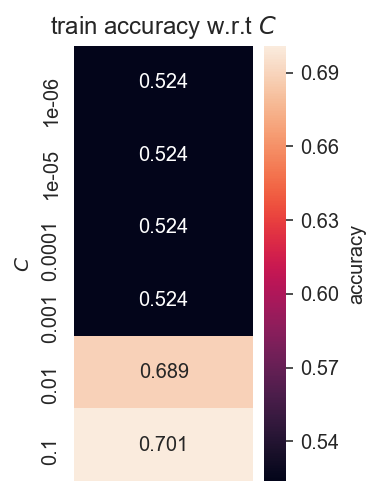

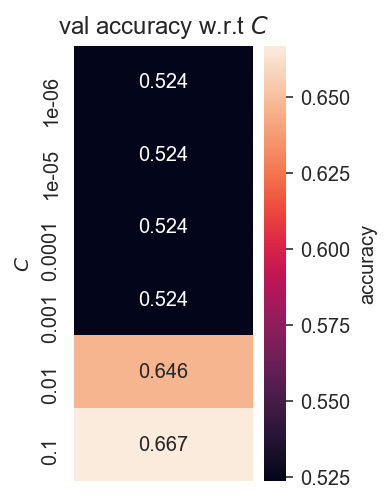

best C value is 0.1
0.7010909090909091
0.6513994910941476


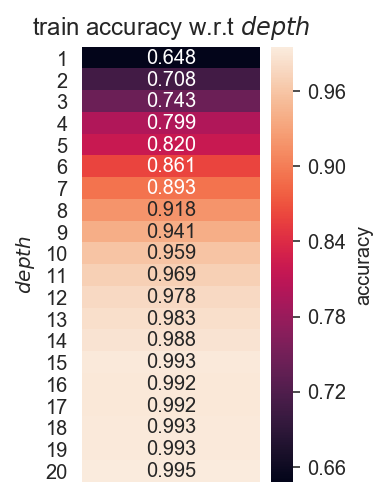

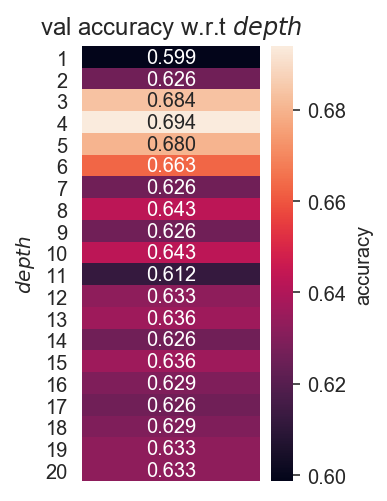

best max depth is 4
0.7390109890109889
0.6776929601357082


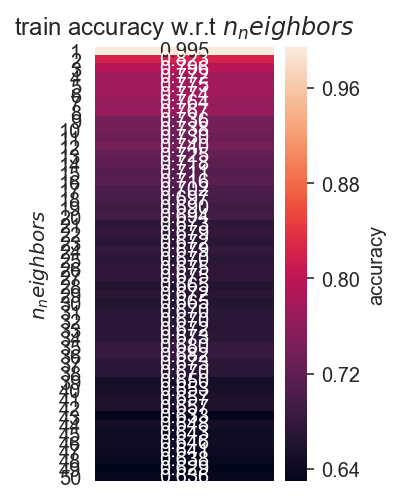

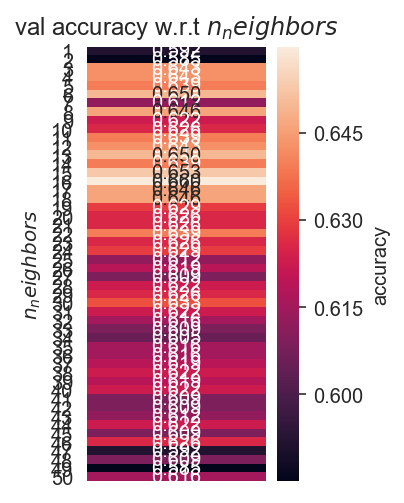

best number of nearest neighbors is 16
0.7011494252873564
0.64715860899067


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


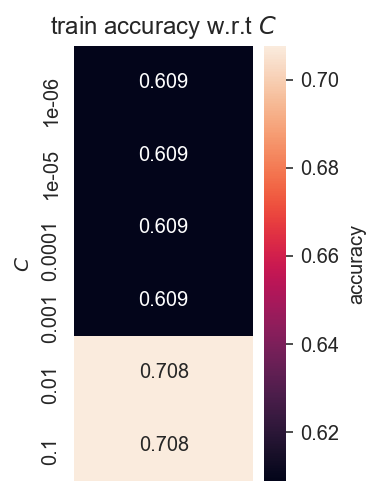

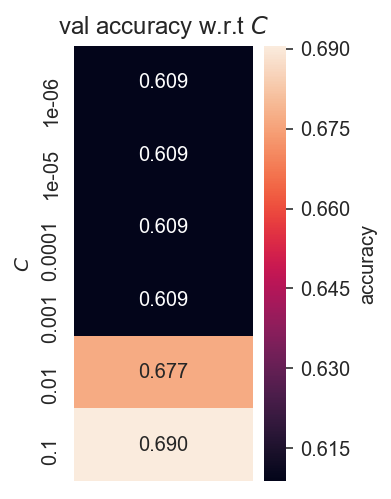

best C value is 0.1
0.7593386405388853
0.6666666666666666


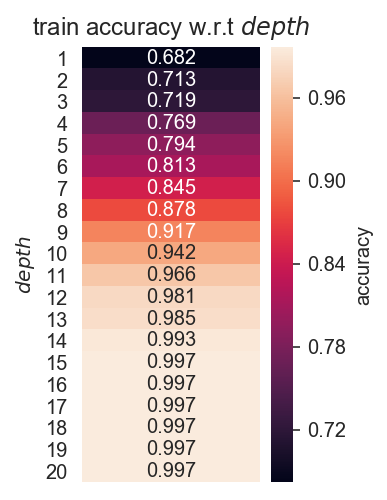

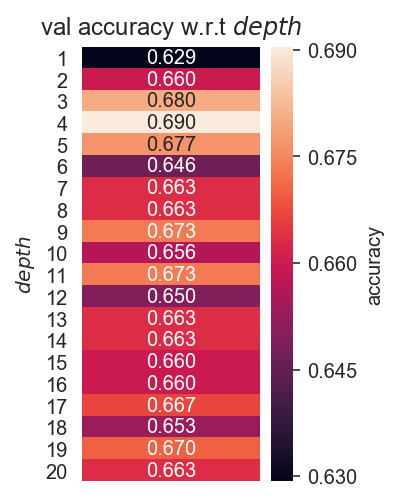

best max depth is 4
0.761455525606469
0.6997455470737913


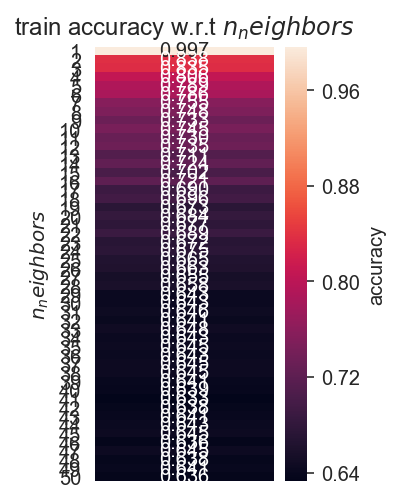

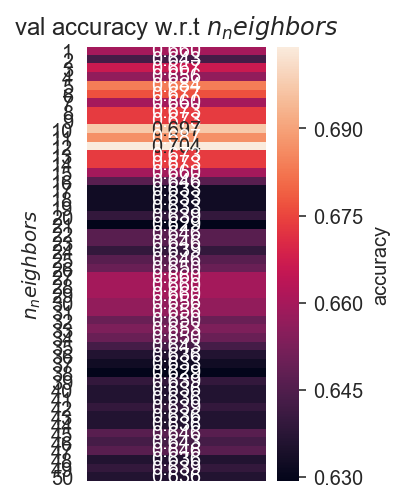

best number of nearest neighbors is 12
0.7495268138801263
0.6632739609838847


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


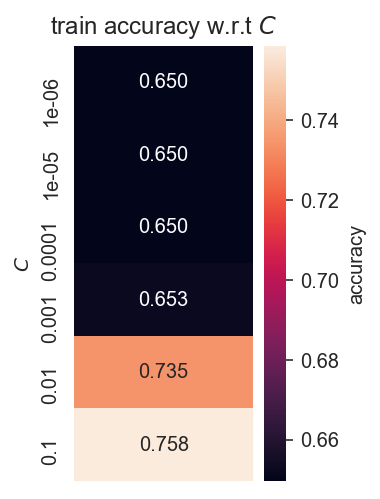

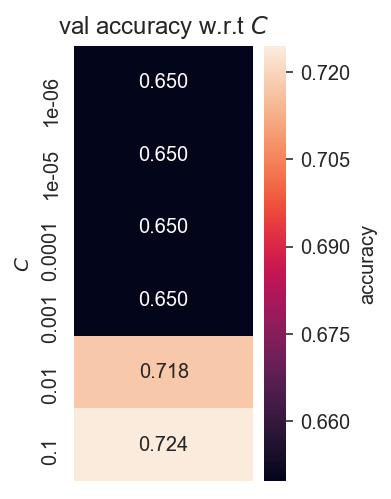

best C value is 0.1
0.7377777777777779
0.6497031382527566


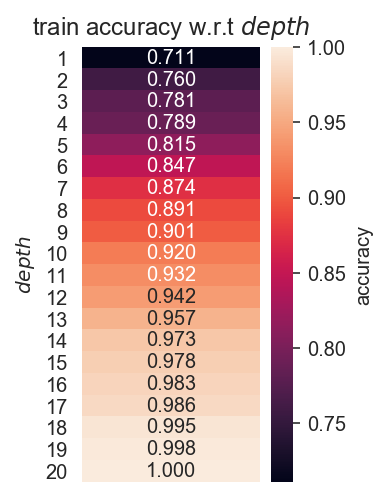

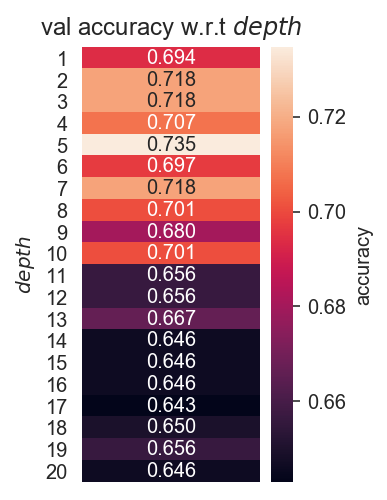

best max depth is 5
0.7487373737373737
0.6624257845631891


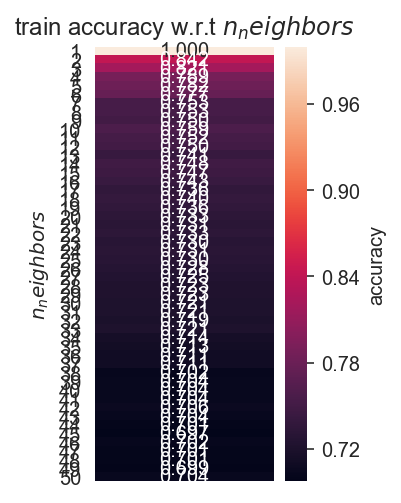

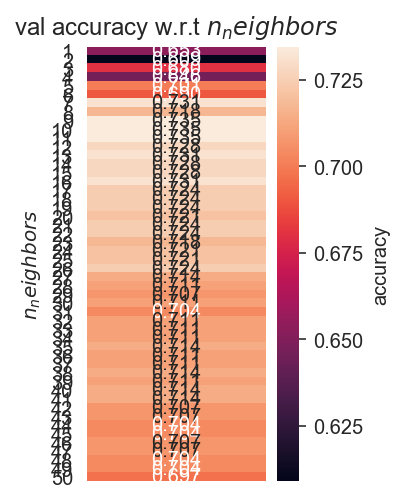

best number of nearest neighbors is 9
0.7289489858635525
0.6259541984732825


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


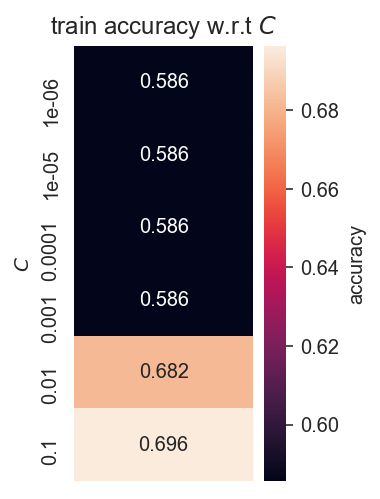

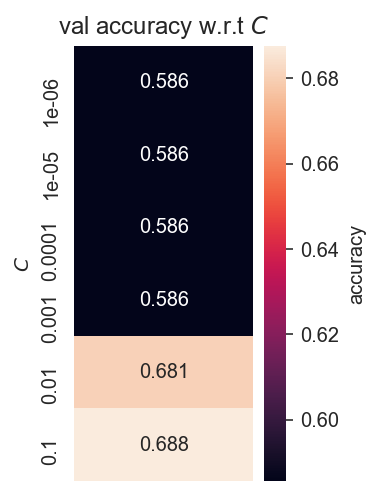

best C value is 0.1
0.7372793354101767
0.6567164179104478


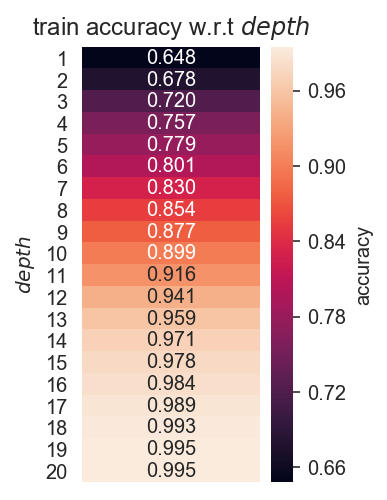

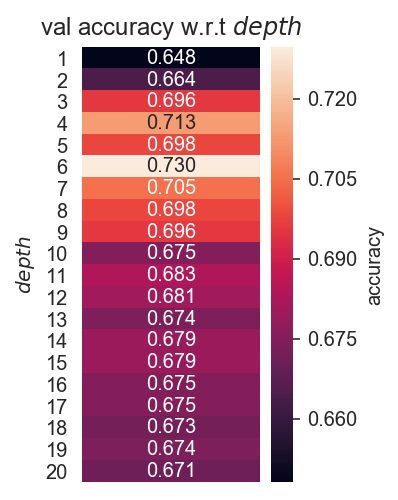

best max depth is 6
0.7626943005181348
0.689280868385346


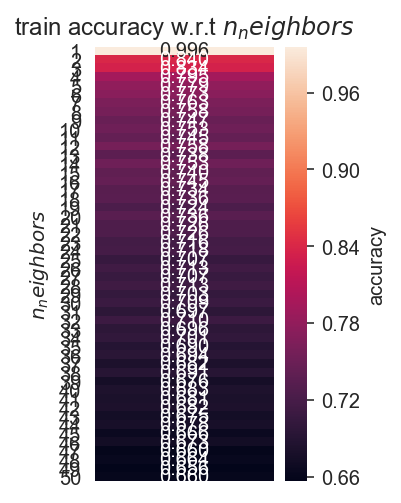

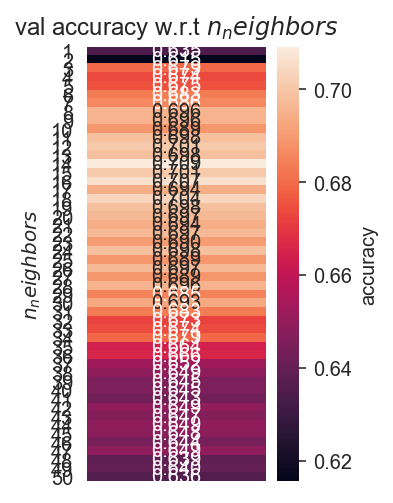

best number of nearest neighbors is 14
0.7358288770053475
0.6648575305291723


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


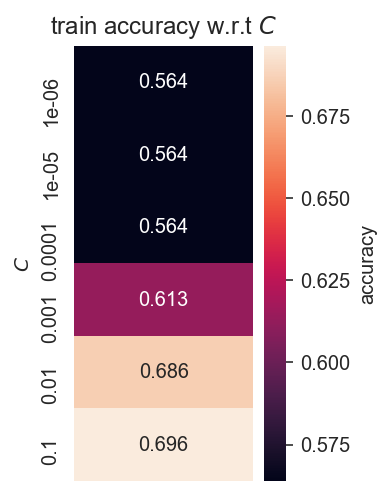

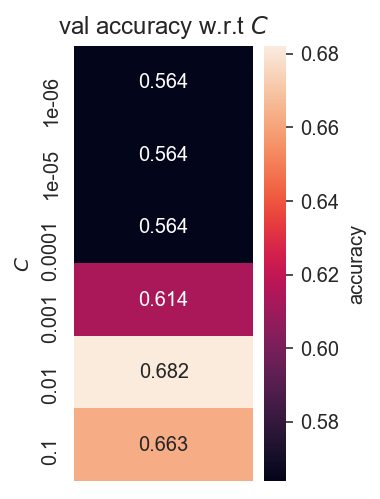

best C value is 0.01
0.75
0.6716417910447762


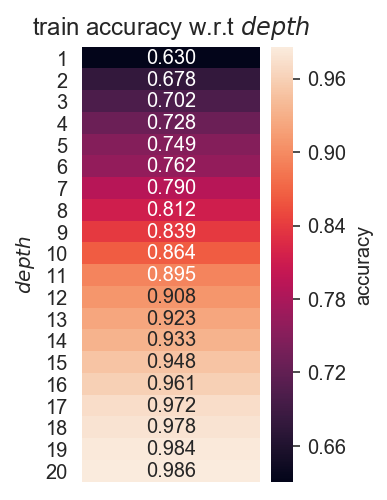

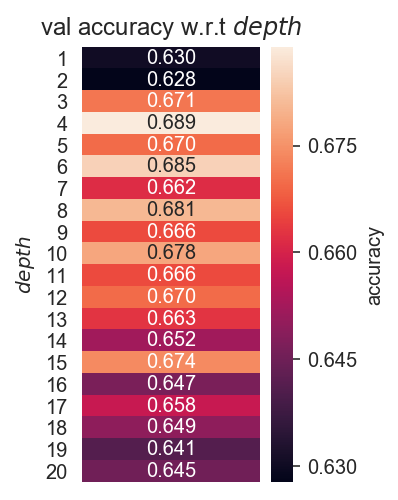

best max depth is 4
0.7695431472081218
0.6919945725915875


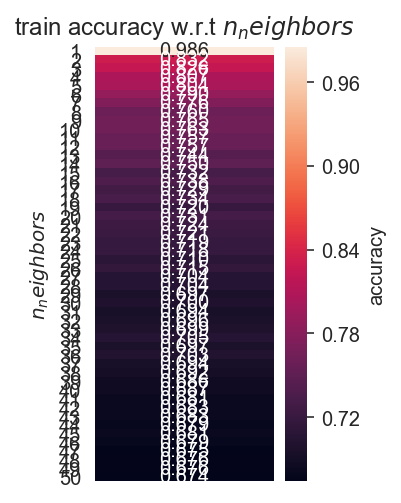

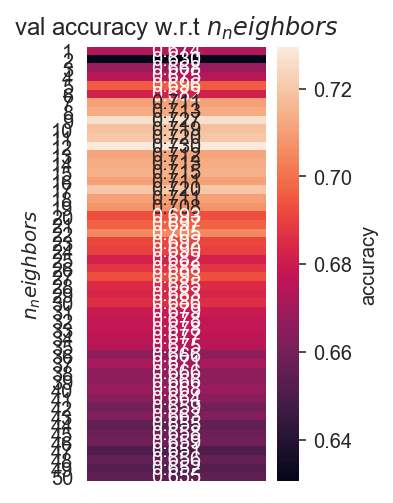

best number of nearest neighbors is 12
0.7318681318681319
0.6689280868385346


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


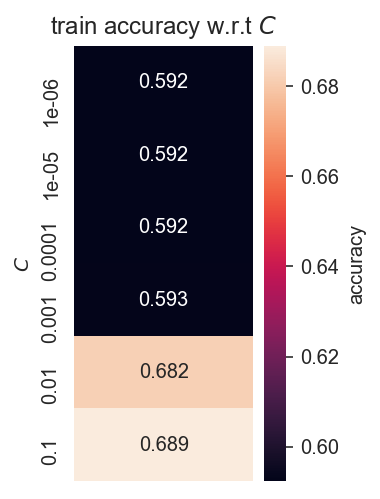

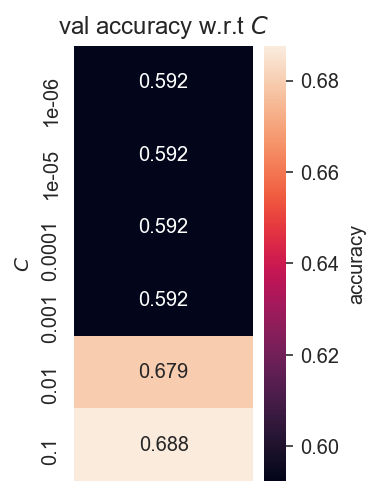

best C value is 0.1
0.7476635514018691
0.6702849389416553


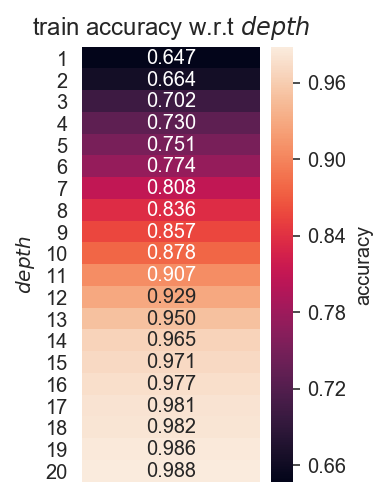

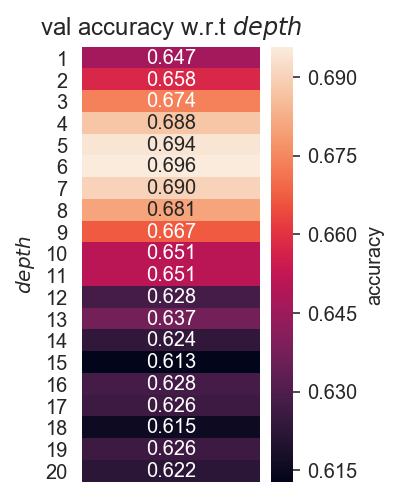

best max depth is 6
0.7625272331154684
0.7042062415196744


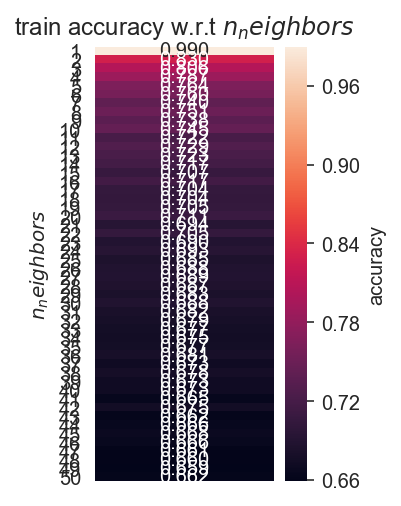

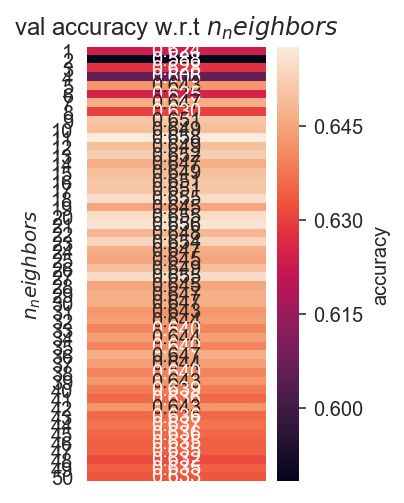

best number of nearest neighbors is 11
0.741901776384535
0.6648575305291723


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


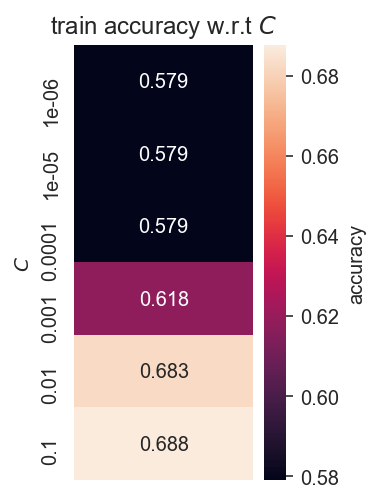

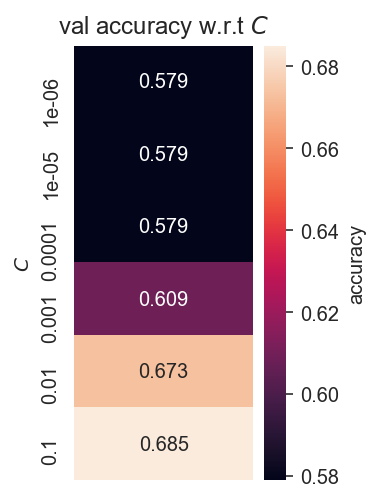

best C value is 0.1
0.7292225201072385
0.6576271186440678


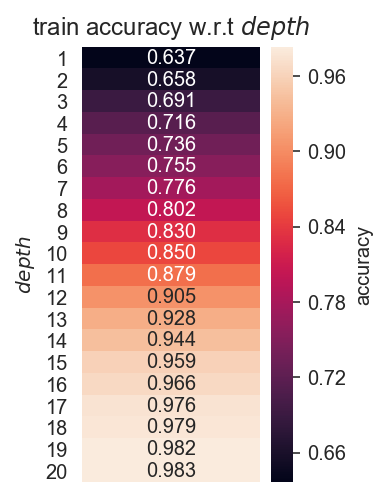

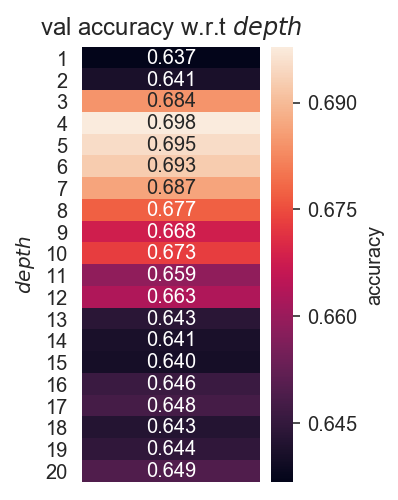

best max depth is 4
0.7777777777777777
0.7288135593220338


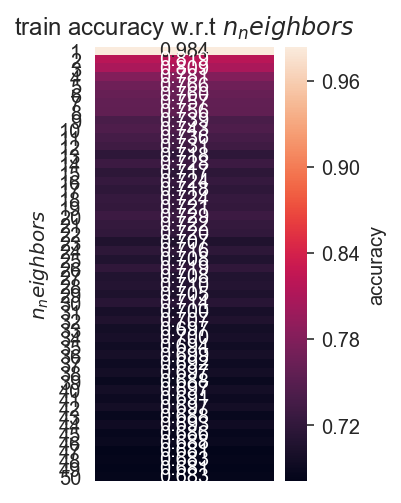

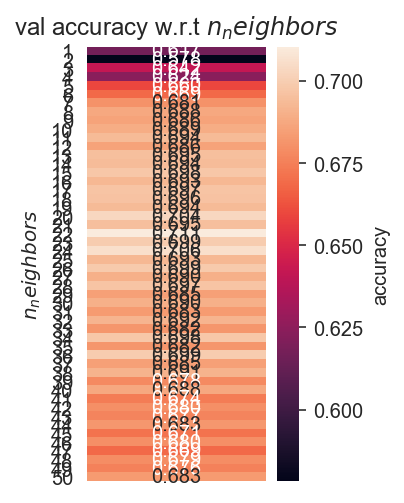

best number of nearest neighbors is 22
0.7891891891891891
0.735593220338983


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


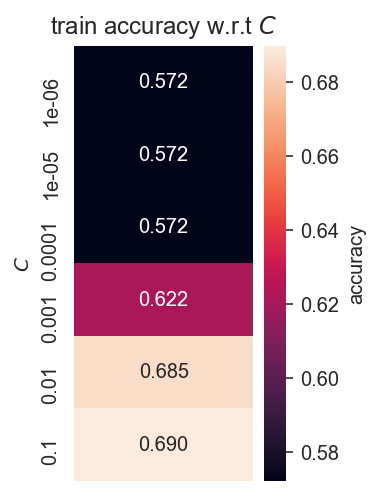

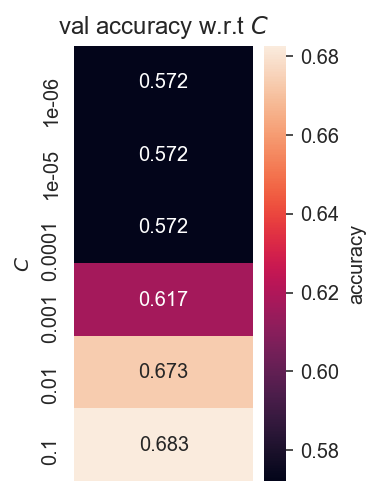

best C value is 0.1
0.7664974619289341
0.688135593220339


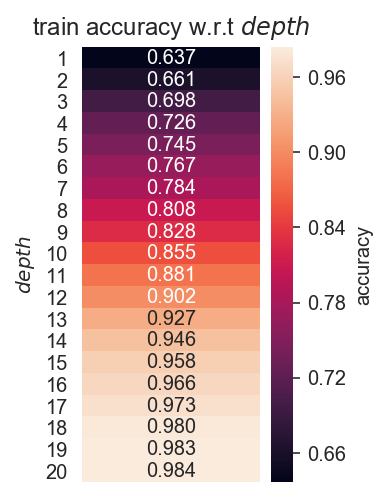

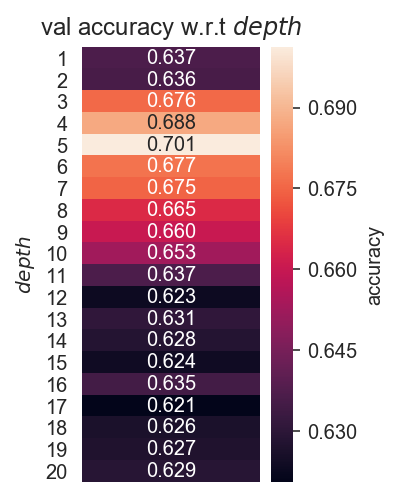

best max depth is 5
0.7868020304568527
0.7152542372881356


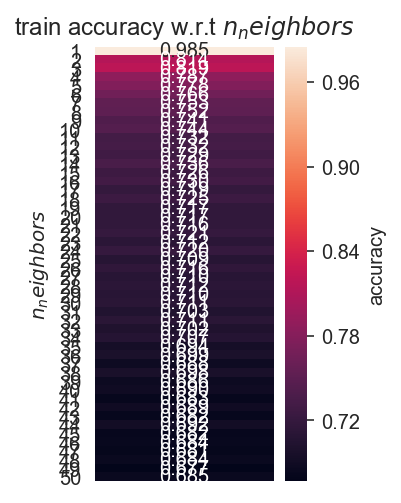

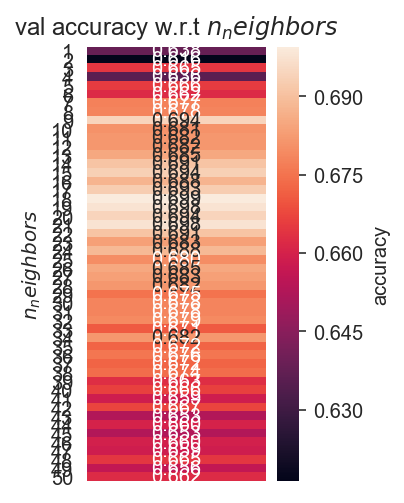

best number of nearest neighbors is 18
0.7948051948051947
0.7322033898305085


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


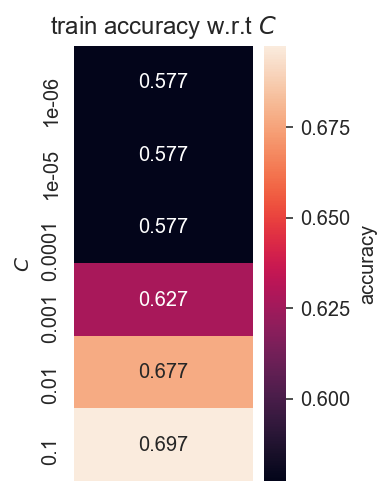

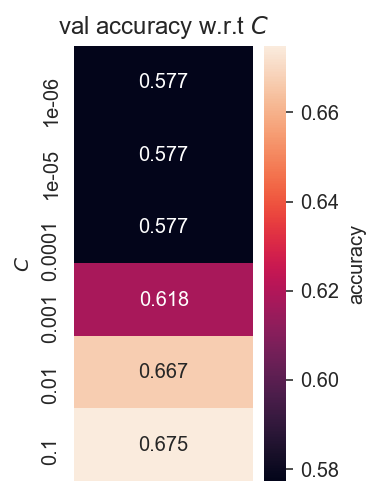

best C value is 0.1
0.7277628032345014
0.6576271186440678


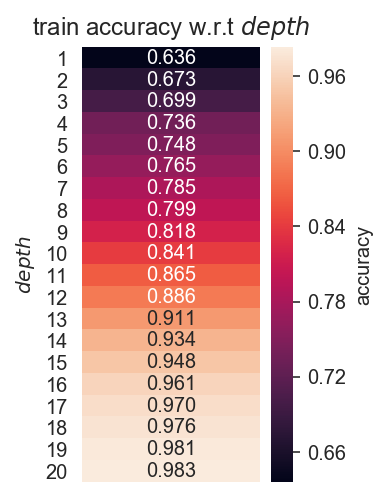

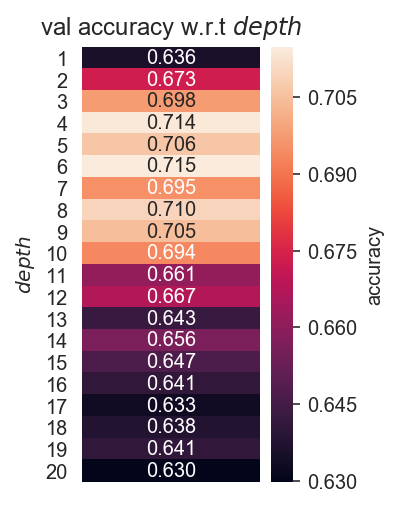

best max depth is 6
0.7804878048780488
0.7254237288135593


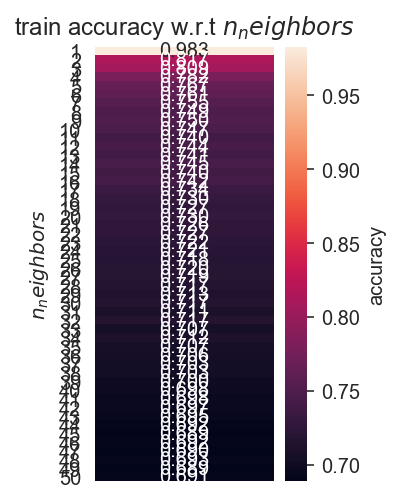

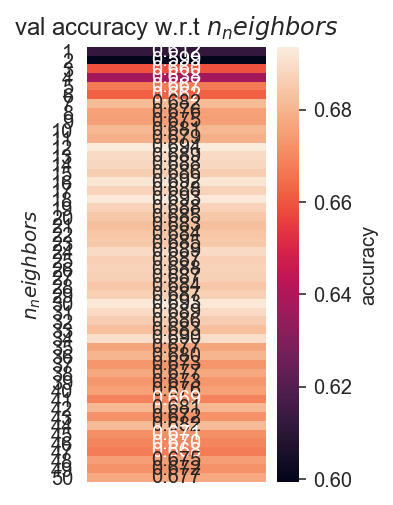

best number of nearest neighbors is 12
0.7392550143266476
0.6915254237288135


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


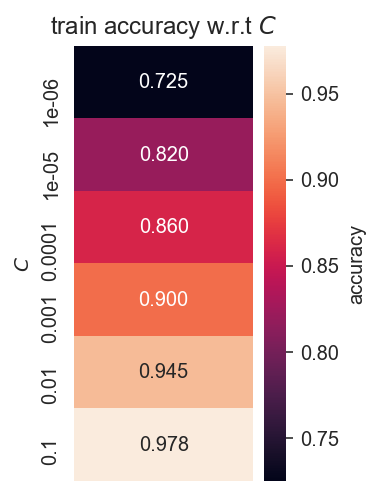

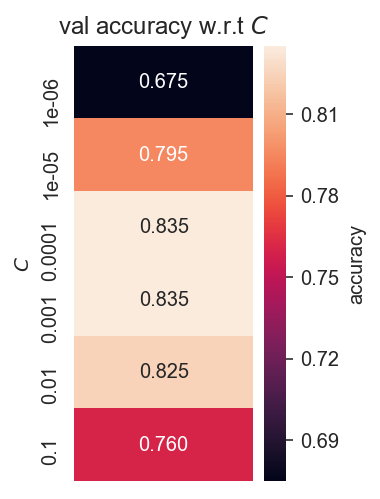

best C value is 0.0001
0.8646125116713352
0.81875


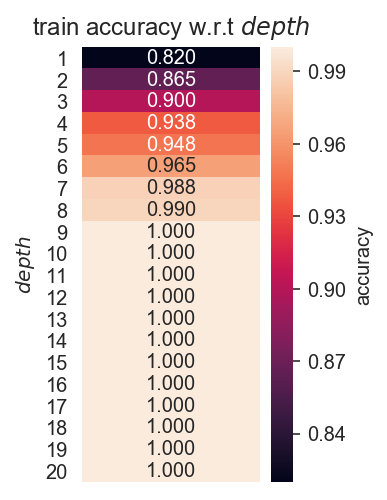

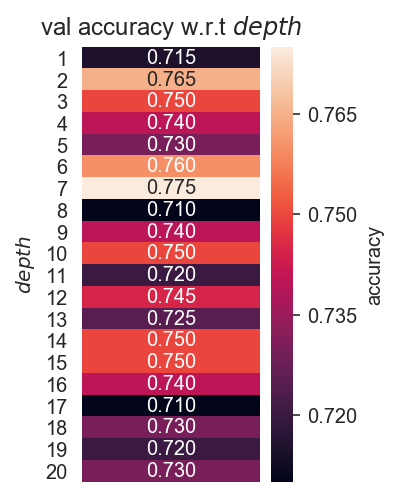

best max depth is 7
0.7741935483870968
0.72


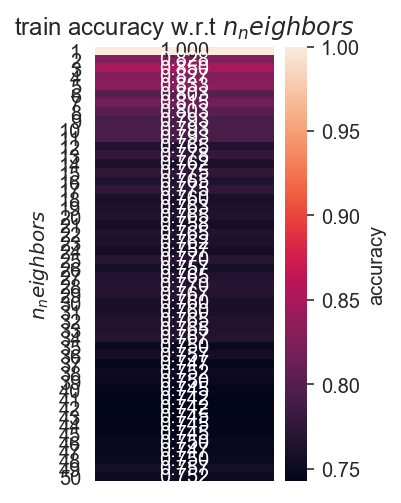

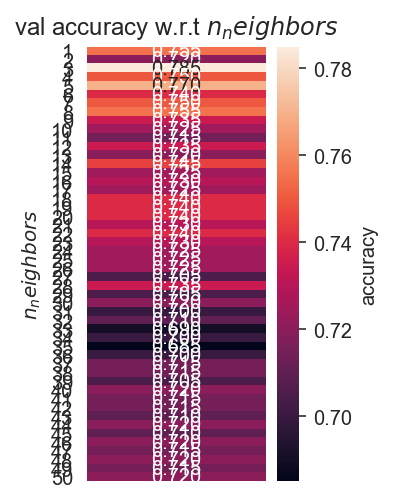

best number of nearest neighbors is 3
0.7780040733197556
0.7275


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


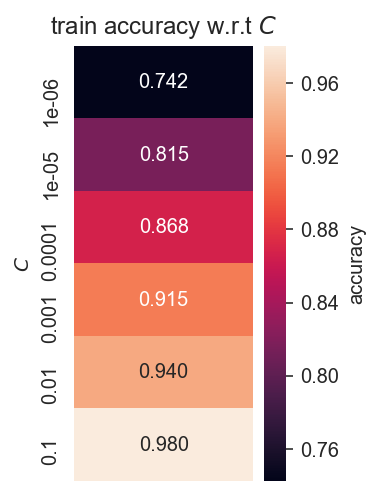

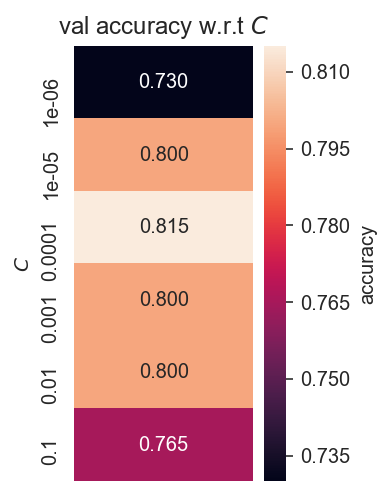

best C value is 0.0001
0.8614514608859566
0.81625


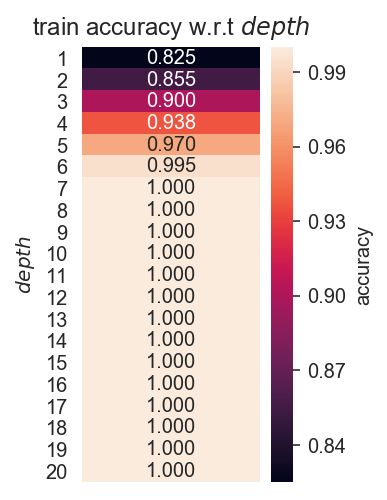

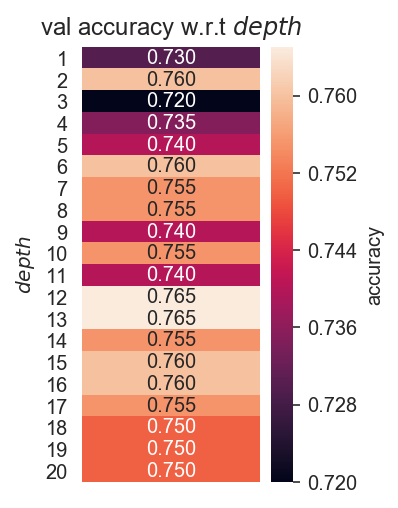

best max depth is 12
0.7952522255192879
0.74125


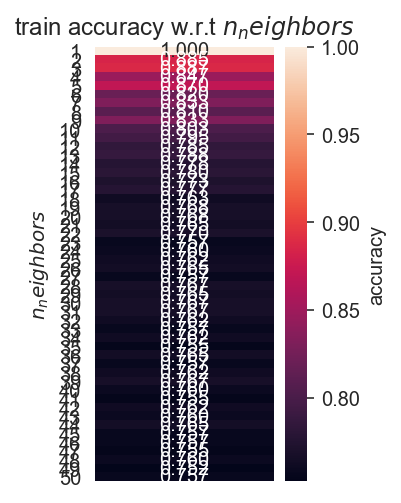

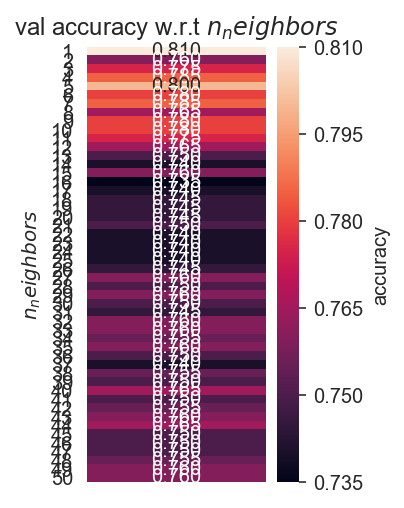

best number of nearest neighbors is 1
0.7765419615773508
0.72375


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


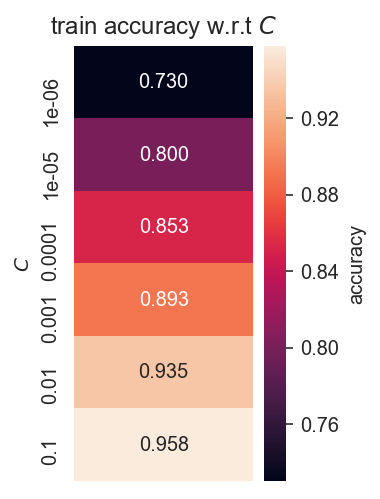

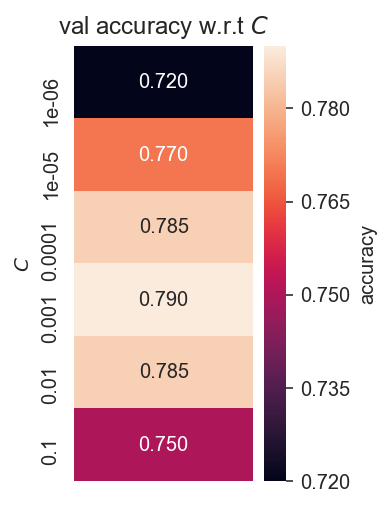

best C value is 0.001
0.8623518687329079
0.81125


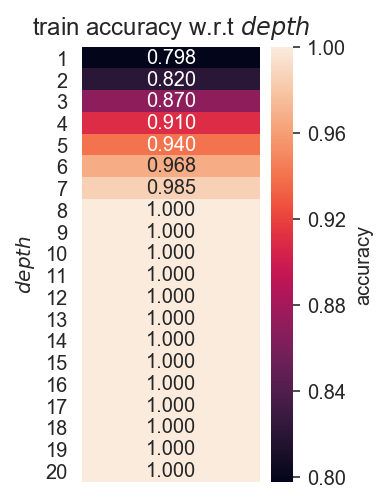

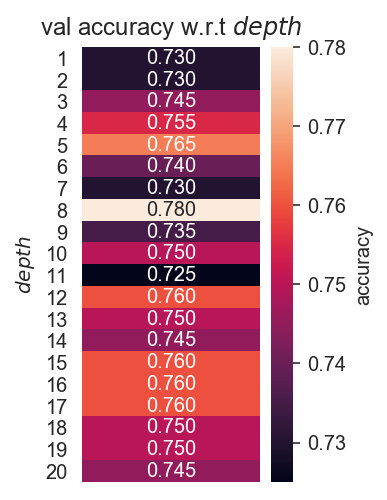

best max depth is 8
0.781029263370333
0.72875


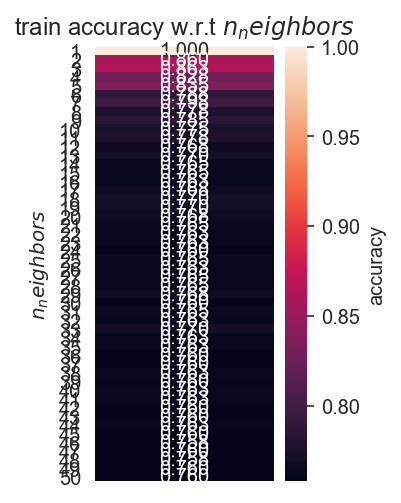

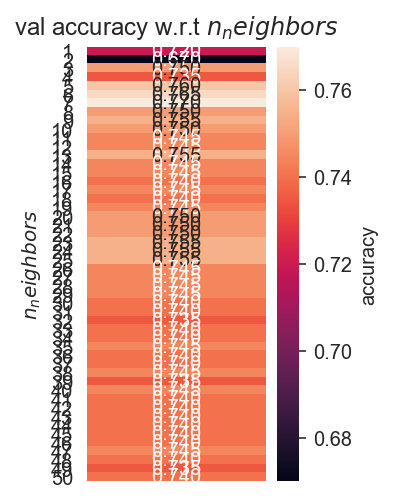

best number of nearest neighbors is 7
0.8240827845719662
0.76625


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


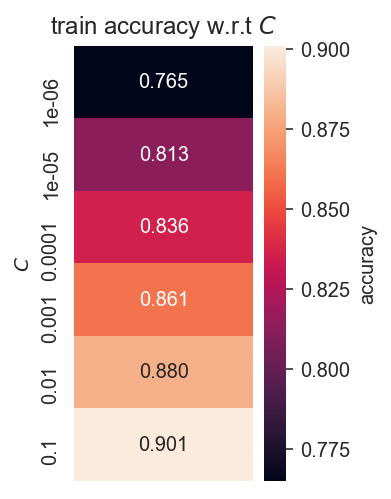

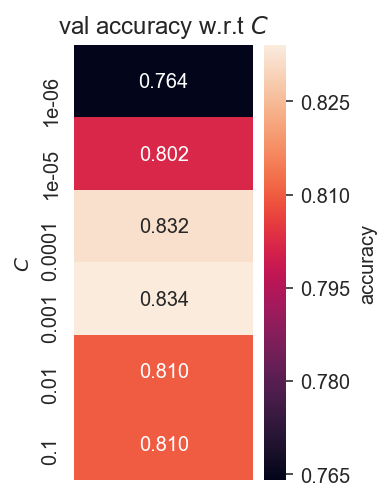

best C value is 0.001
0.8710166919575114
0.83


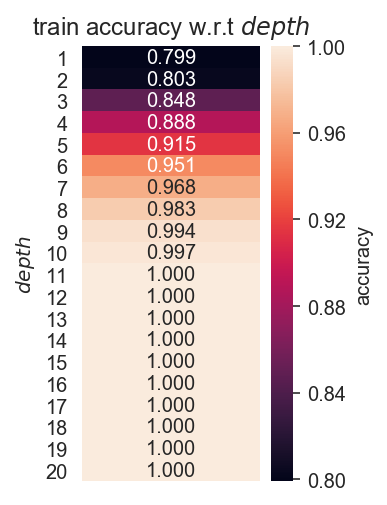

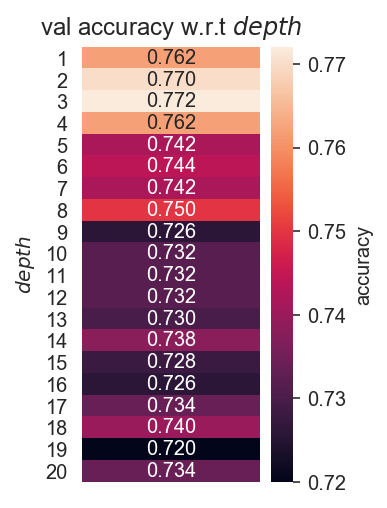

best max depth is 3
0.8351999999999999
0.794


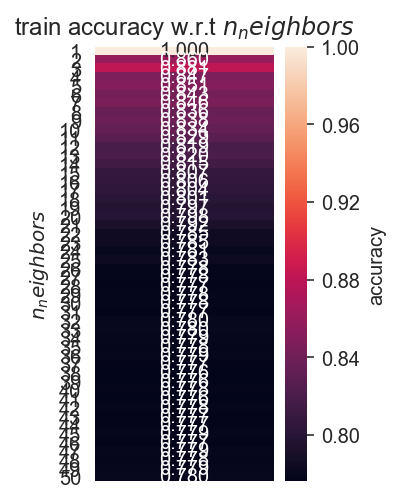

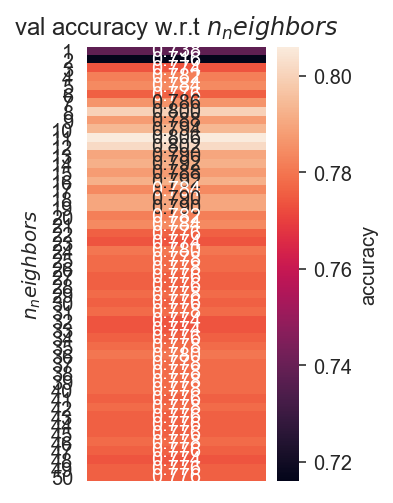

best number of nearest neighbors is 11
0.8325508607198748
0.786


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


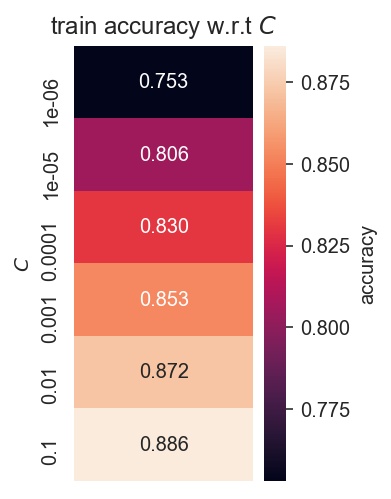

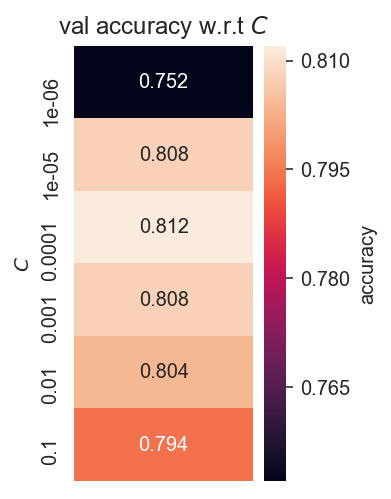

best C value is 0.0001
0.8763040238450073
0.834


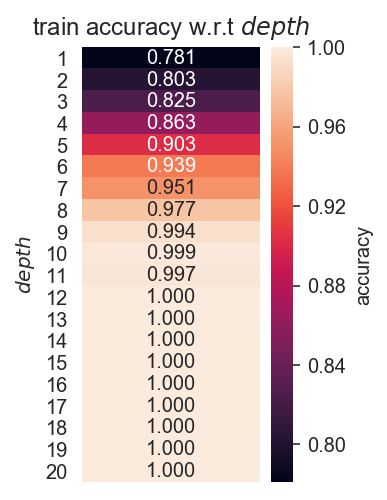

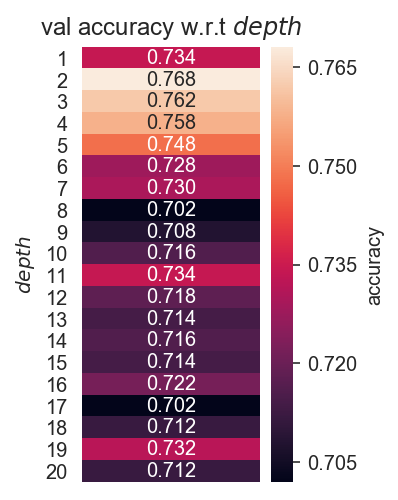

best max depth is 2
0.8520900321543409
0.816


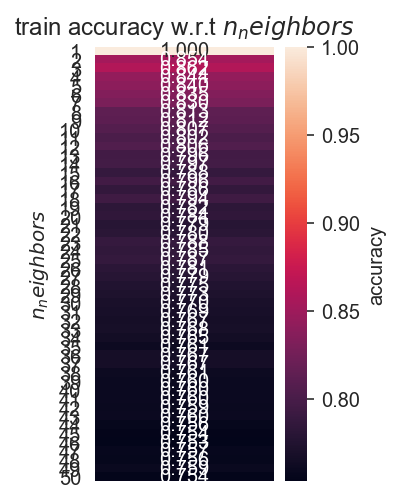

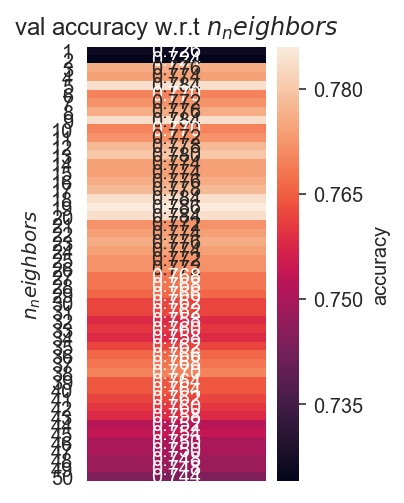

best number of nearest neighbors is 19
0.8467374810318665
0.798


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


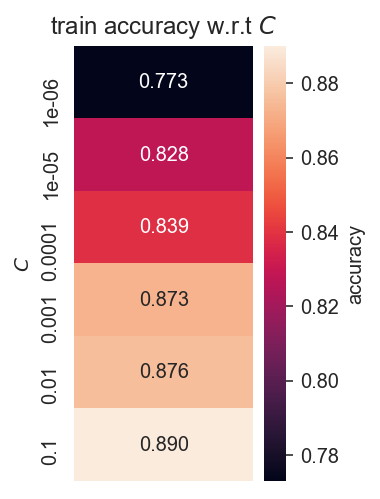

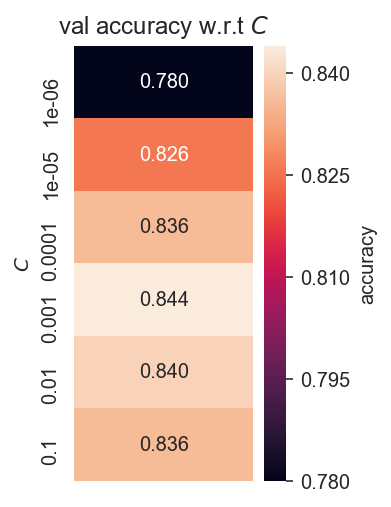

best C value is 0.001
0.8603896103896104
0.828


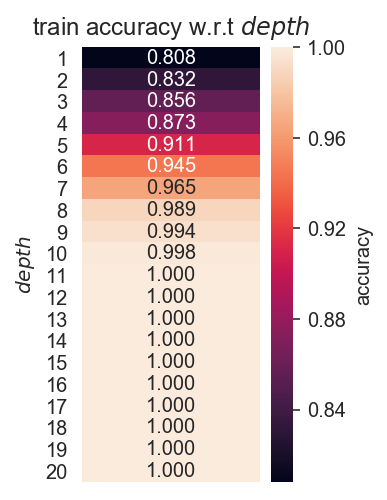

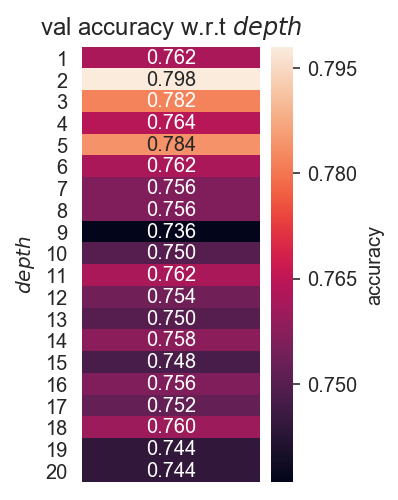

best max depth is 2
0.8105590062111802
0.756


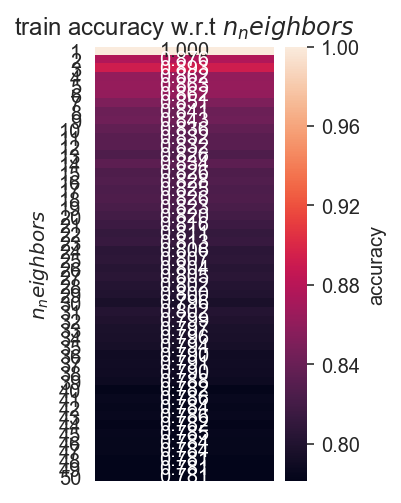

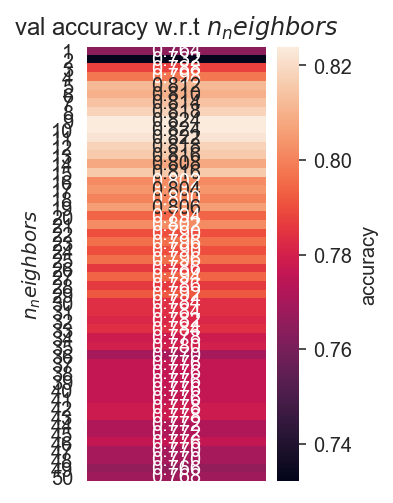

best number of nearest neighbors is 9
0.8254486133768352
0.786


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


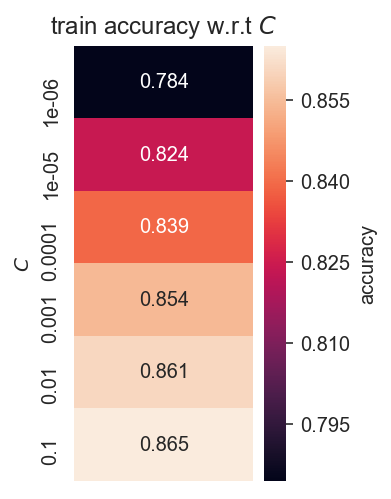

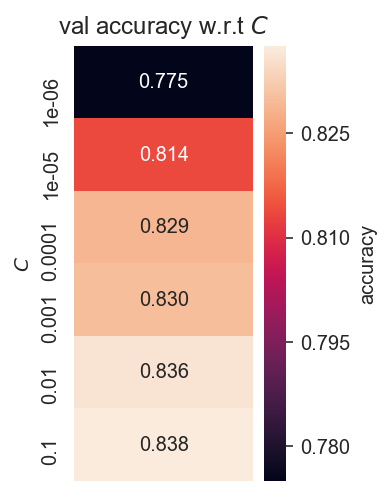

best C value is 0.1
0.8679245283018867
0.825


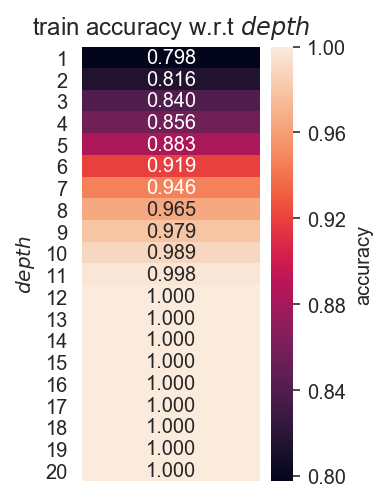

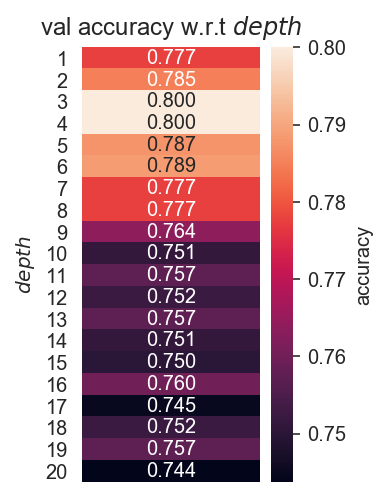

best max depth is 3
0.8387096774193549
0.8


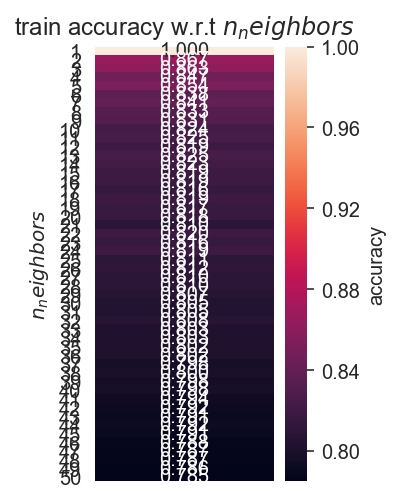

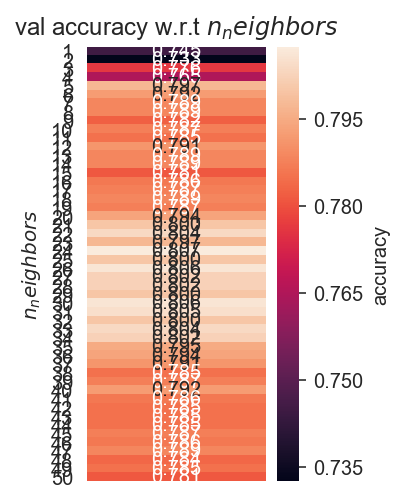

best number of nearest neighbors is 24
0.8306451612903226
0.79


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


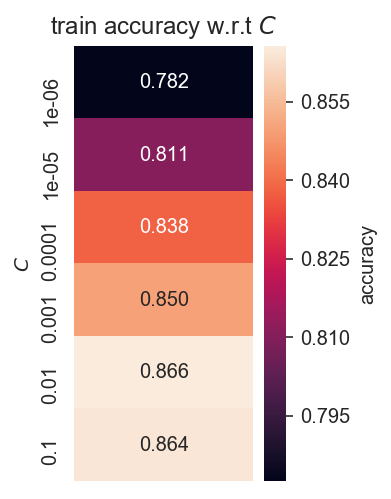

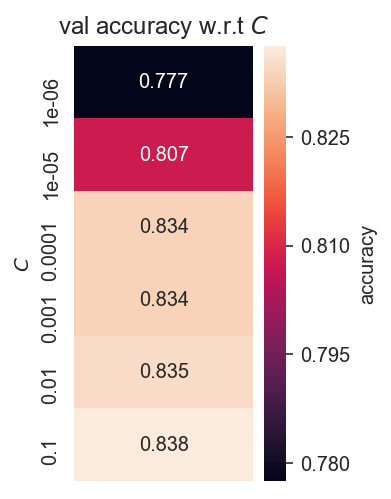

best C value is 0.1
0.888030888030888
0.855


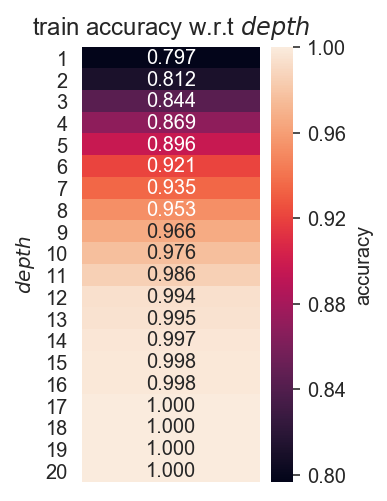

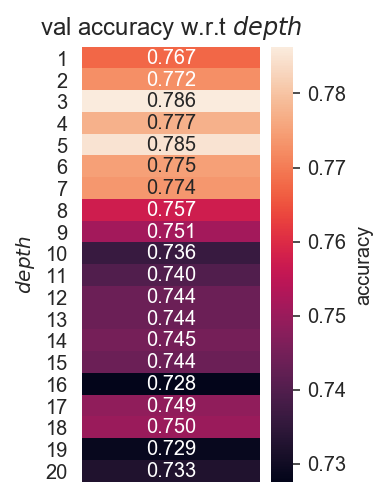

best max depth is 3
0.8769230769230769
0.84


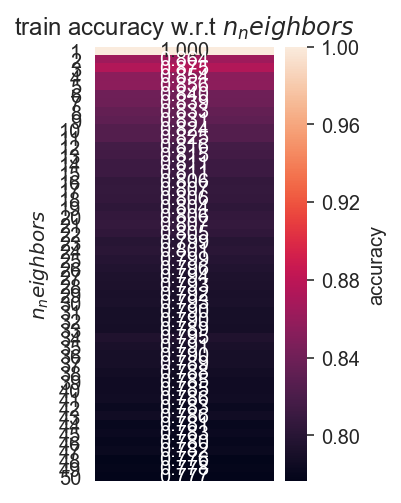

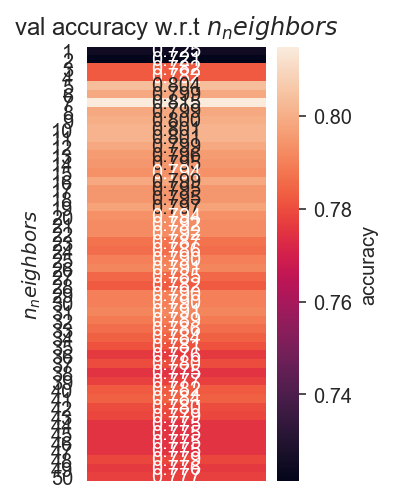

best number of nearest neighbors is 7
0.8549019607843137
0.815


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


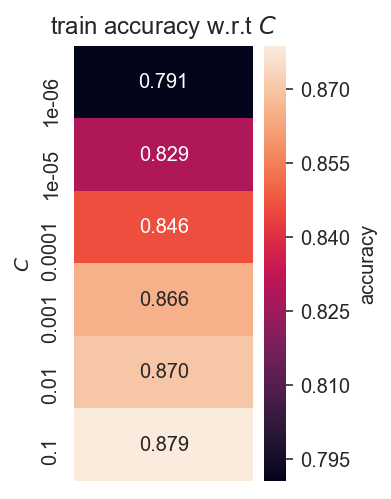

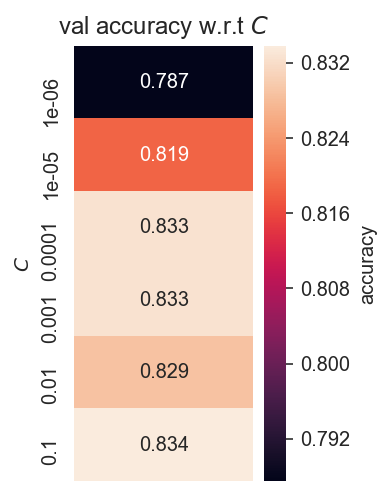

best C value is 0.1
0.8692579505300353
0.815


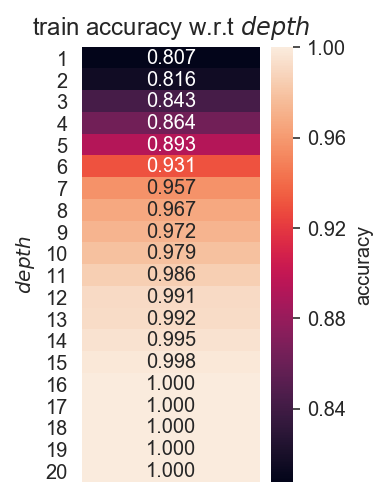

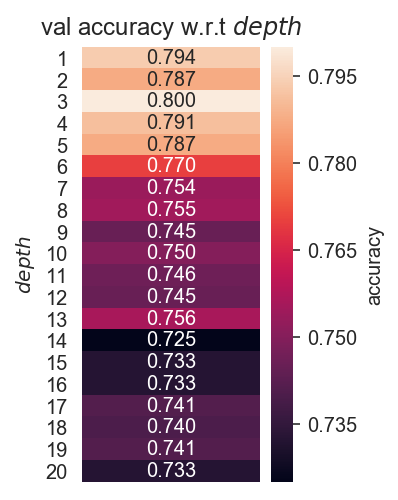

best max depth is 3
0.845878136200717
0.785


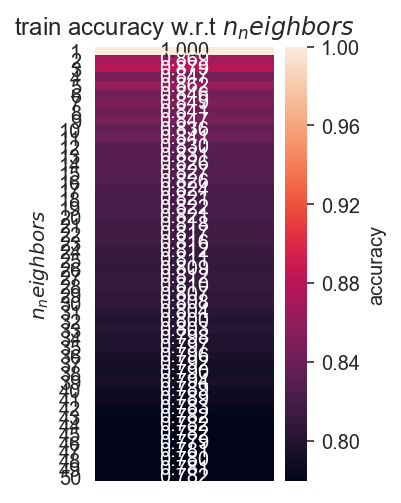

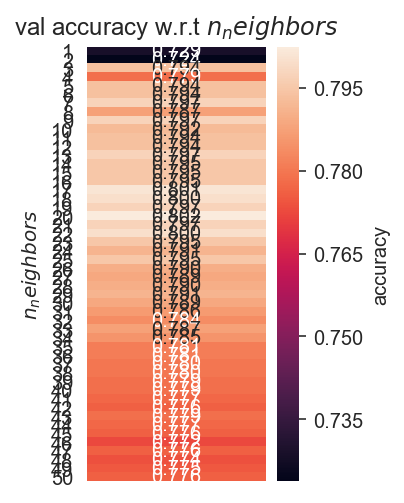

best number of nearest neighbors is 20
0.8436363636363635
0.785


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


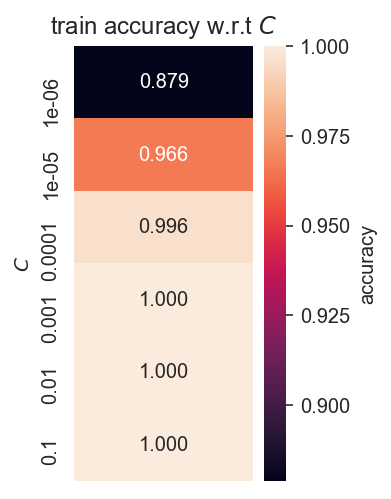

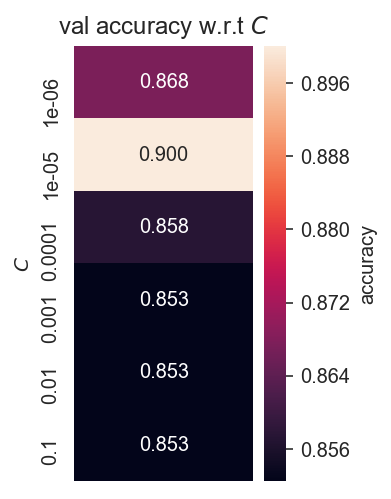

best C value is 1e-05
0.7183098591549297
0.925


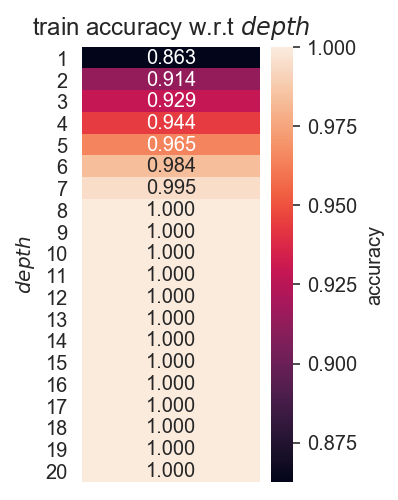

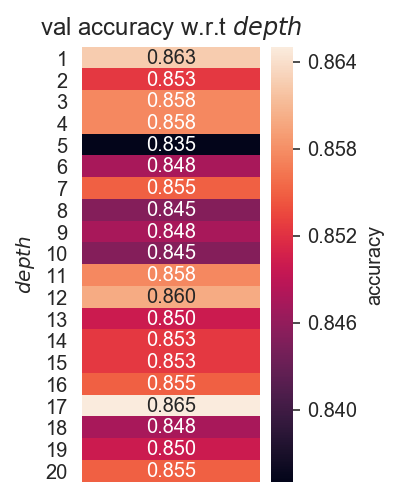

best max depth is 17
0.6238532110091742
0.871875


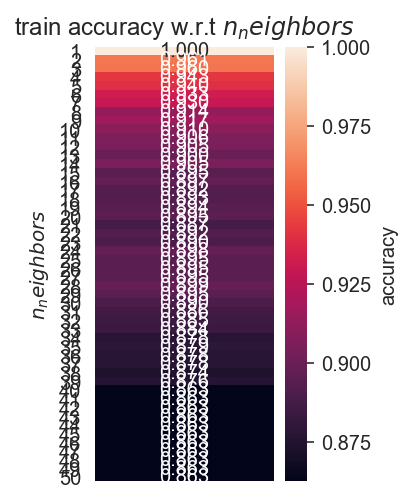

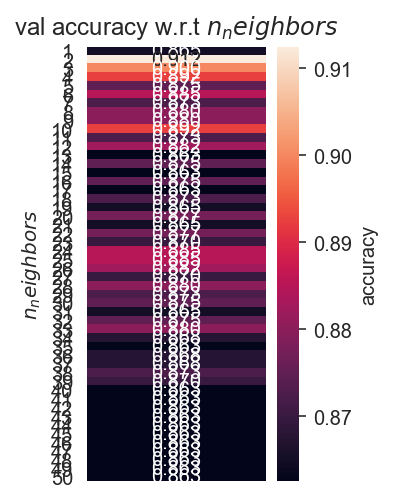

best number of nearest neighbors is 2
0.699074074074074
0.91875


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


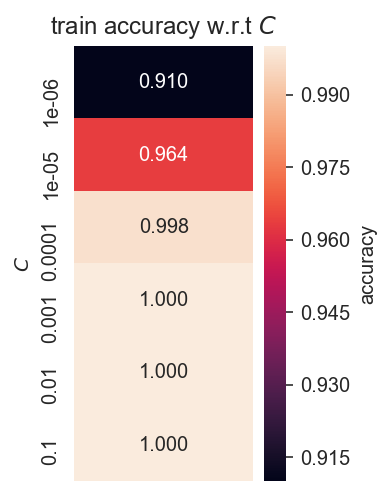

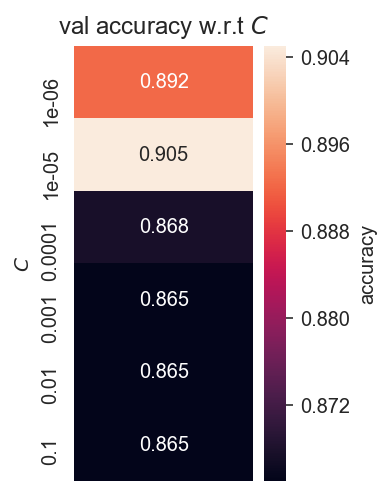

best C value is 1e-05
0.6780383795309168
0.905625


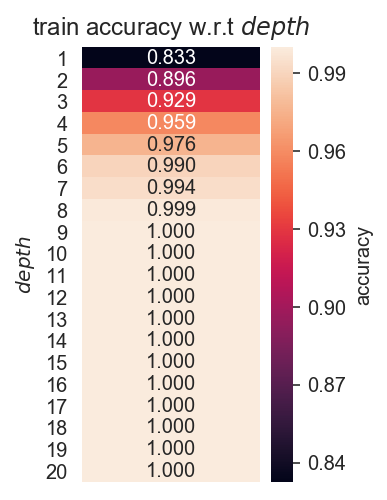

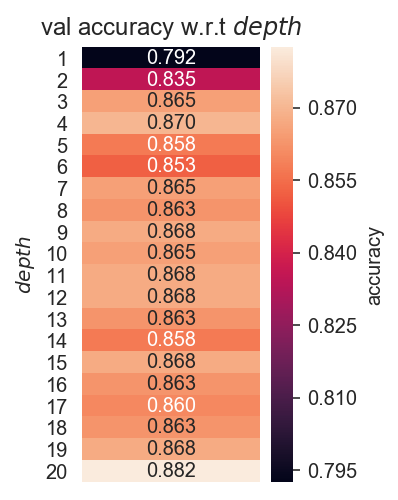

best max depth is 20
0.5745856353591161
0.855625


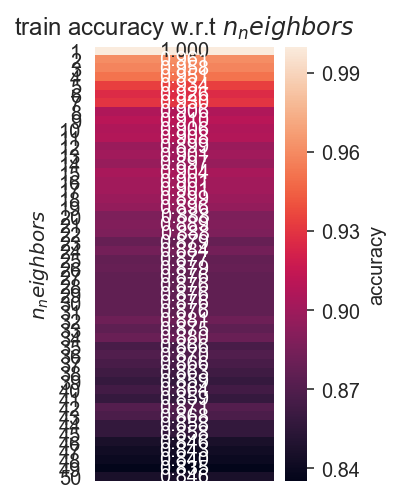

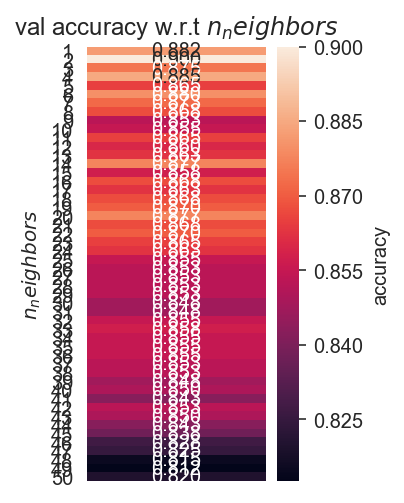

best number of nearest neighbors is 2
0.7314814814814815
0.9275


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


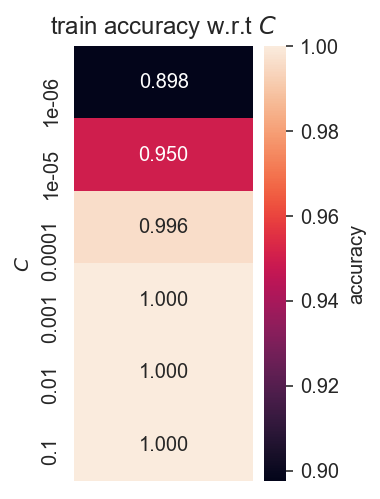

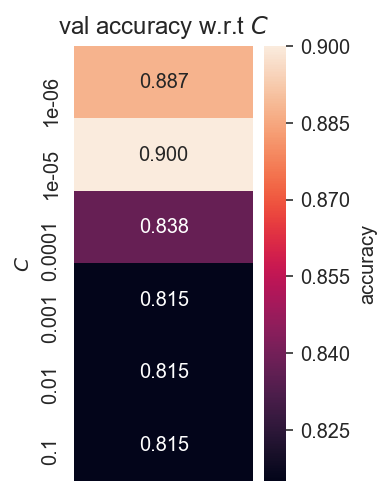

best C value is 1e-05
0.7386091127098321
0.931875


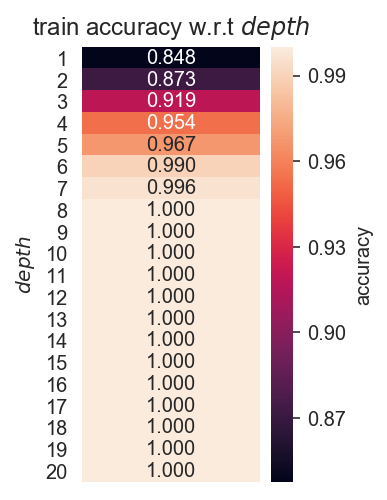

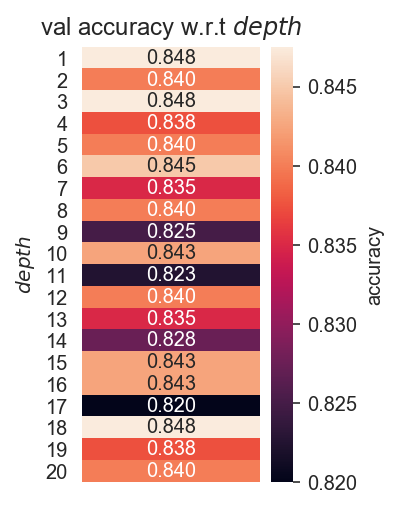

best max depth is 1
0.0
0.84375


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


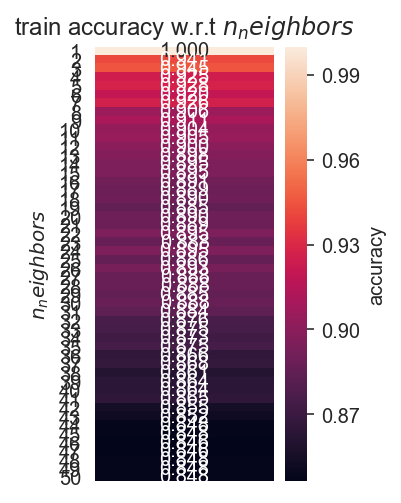

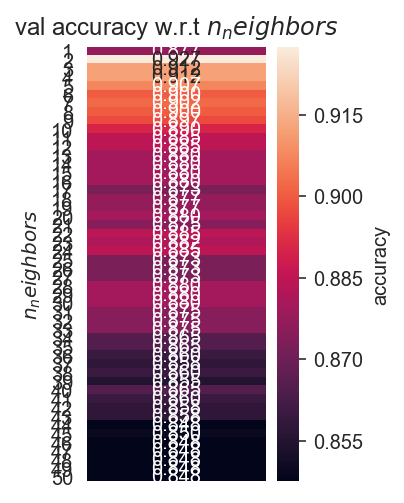

best number of nearest neighbors is 2
0.6950000000000001
0.92375


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


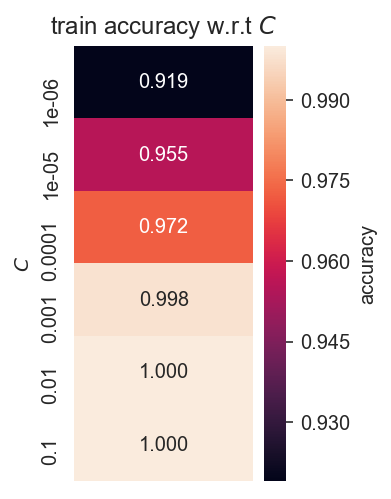

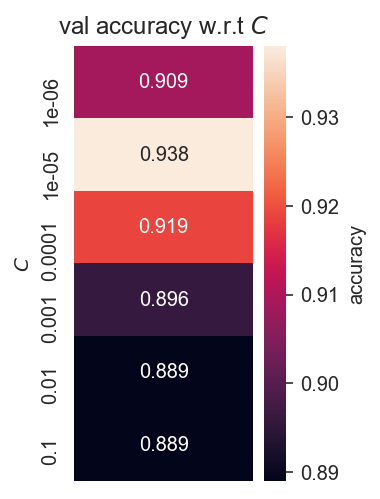

best C value is 1e-05
0.7472527472527473
0.931


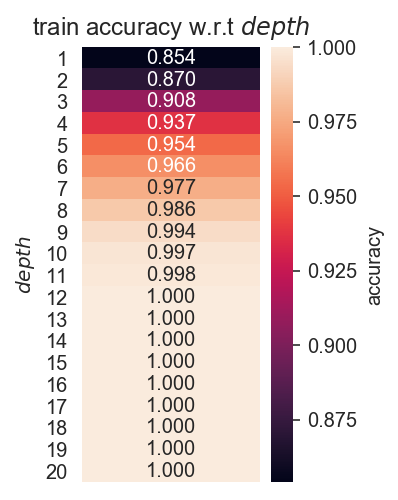

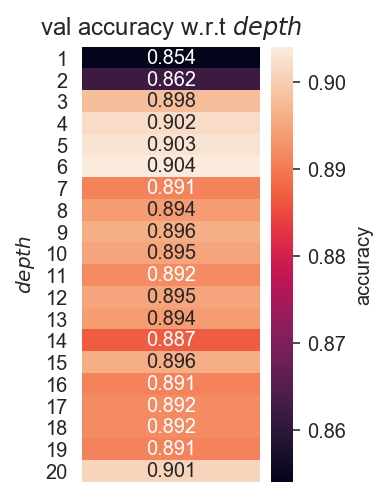

best max depth is 6
0.6666666666666666
0.907


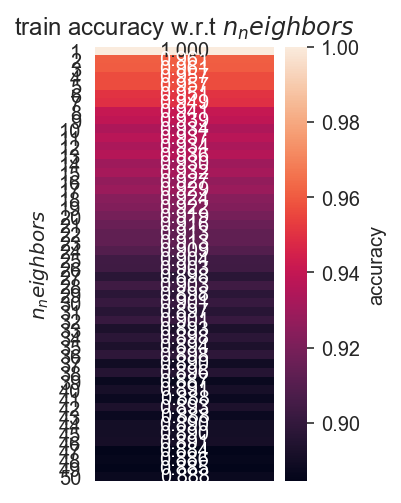

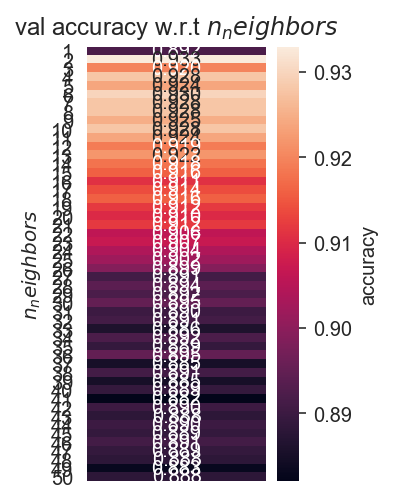

best number of nearest neighbors is 2
0.7916666666666667
0.94


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


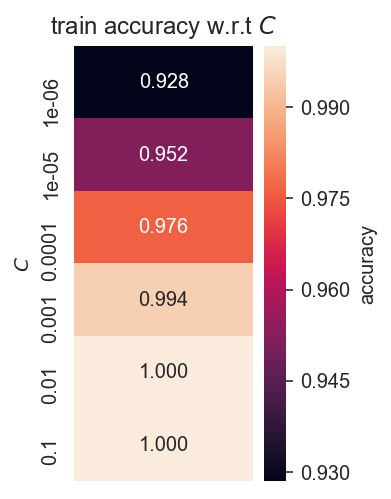

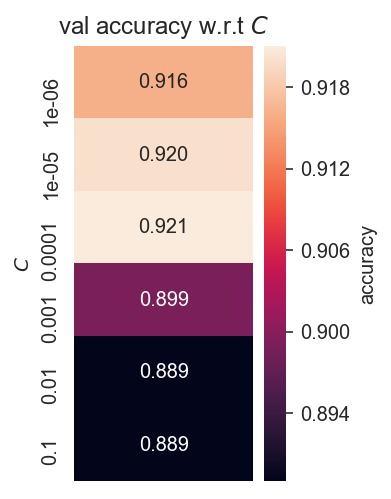

best C value is 0.0001
0.7491638795986622
0.925


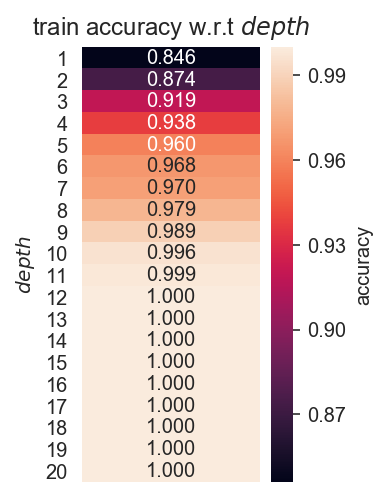

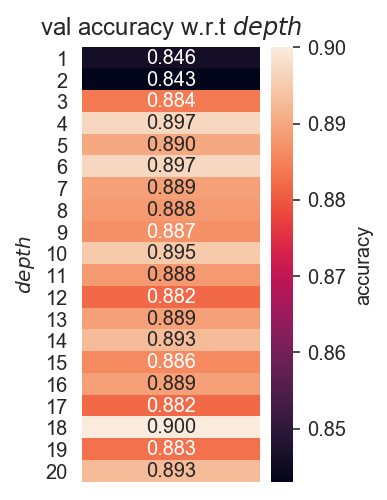

best max depth is 18
0.6777408637873754
0.903


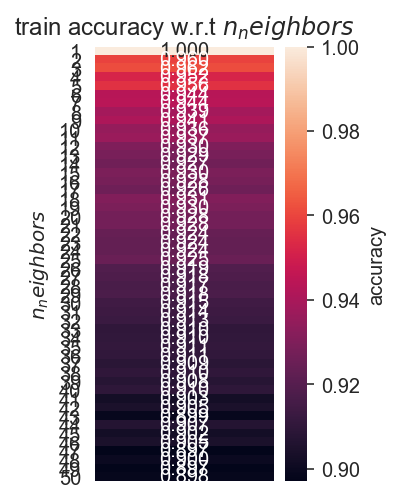

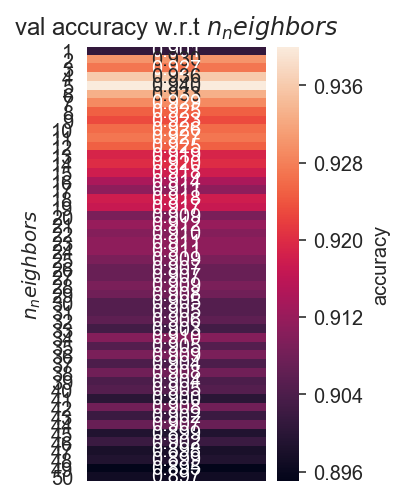

best number of nearest neighbors is 5
0.8
0.943


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


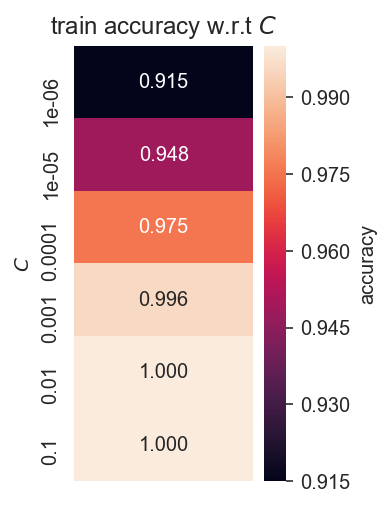

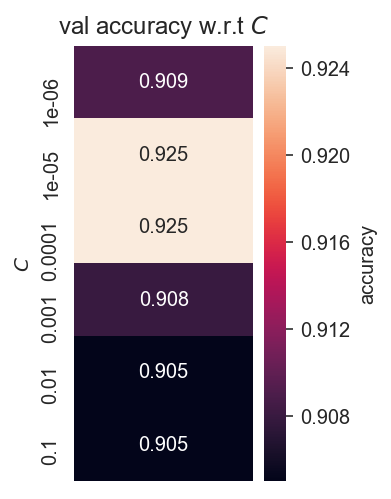

best C value is 1e-05
0.7633587786259544
0.938


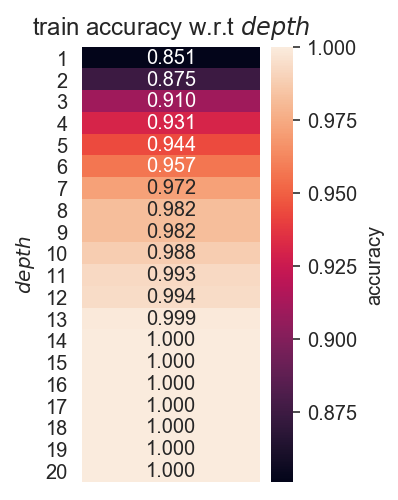

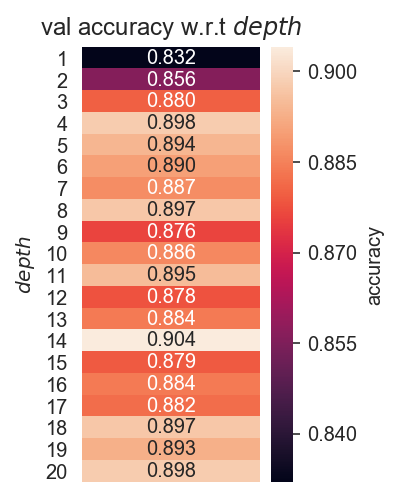

best max depth is 14
0.7303754266211604
0.921


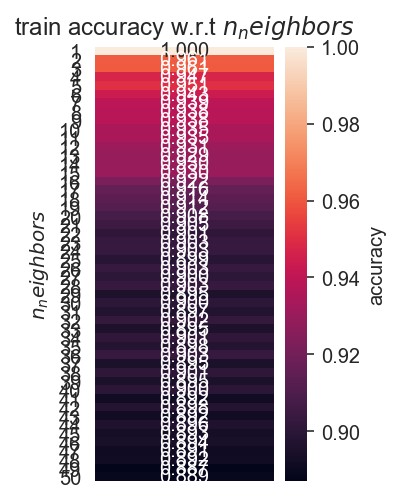

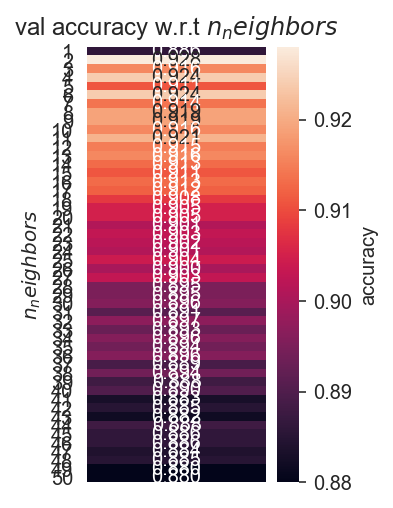

best number of nearest neighbors is 2
0.7803030303030304
0.942


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


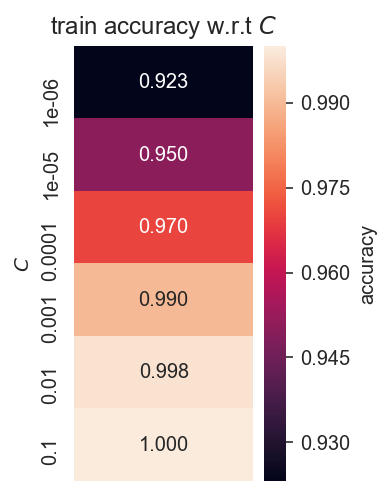

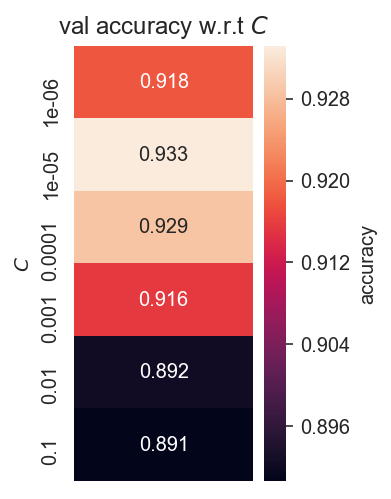

best C value is 1e-05
0.8070175438596492
0.945


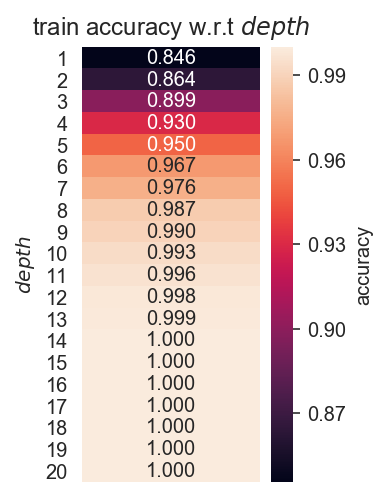

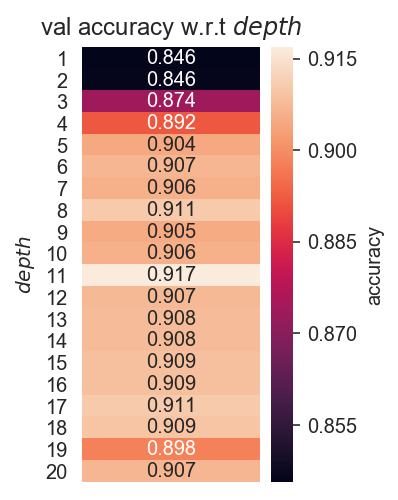

best max depth is 11
0.7111111111111111
0.9025


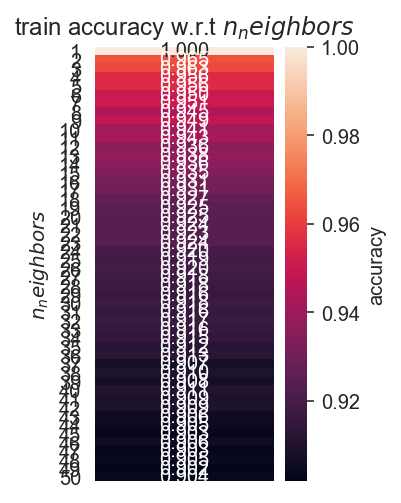

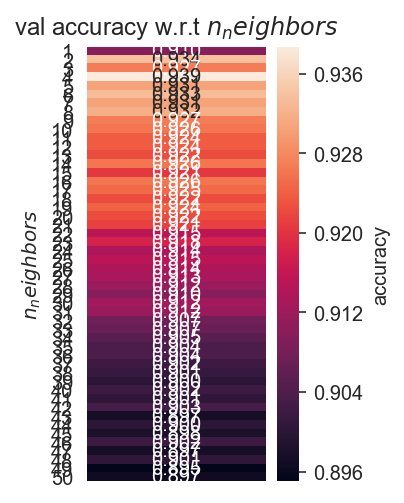

best number of nearest neighbors is 4
0.8448275862068965
0.955


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


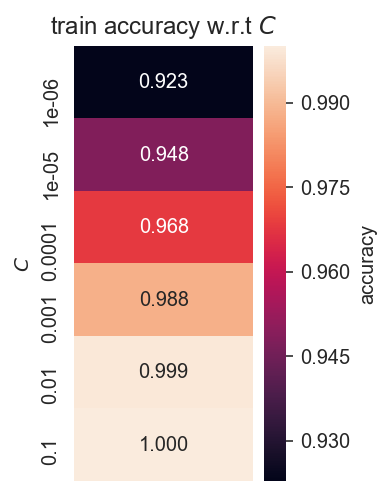

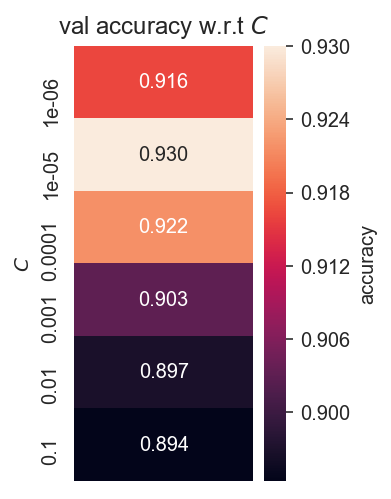

best C value is 1e-05
0.7804878048780487
0.955


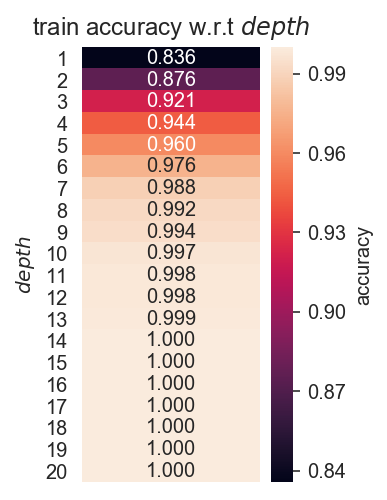

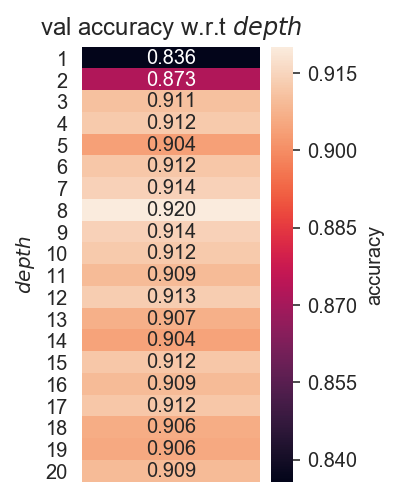

best max depth is 8
0.7111111111111111
0.935


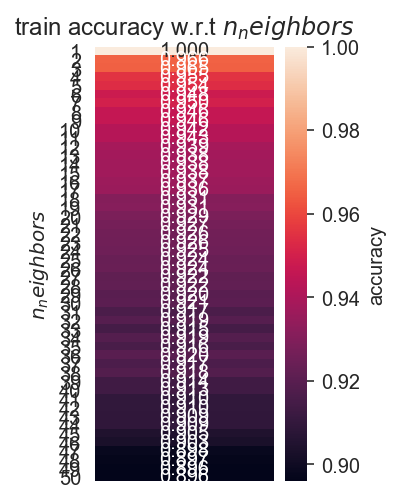

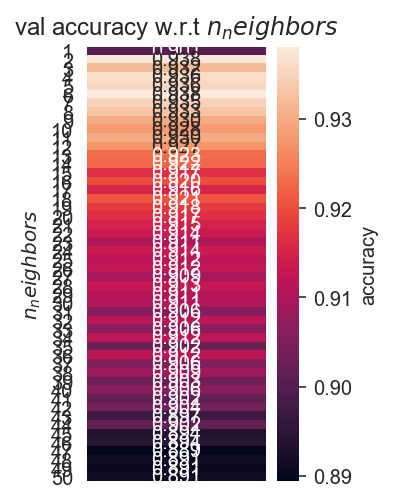

best number of nearest neighbors is 6
0.7906976744186046
0.955


C:\Users\Poker\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


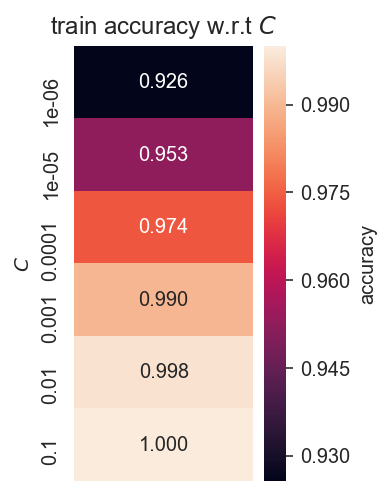

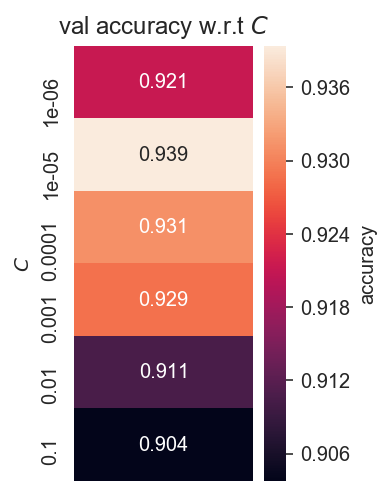

best C value is 1e-05
0.7874015748031497
0.9325


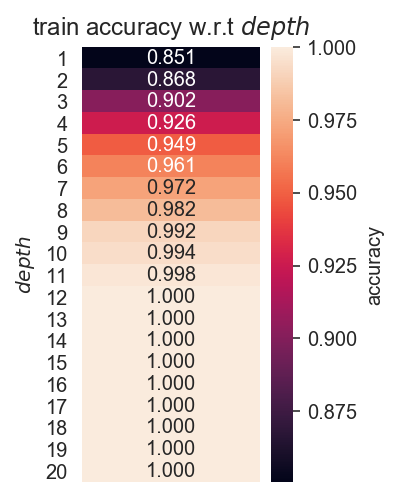

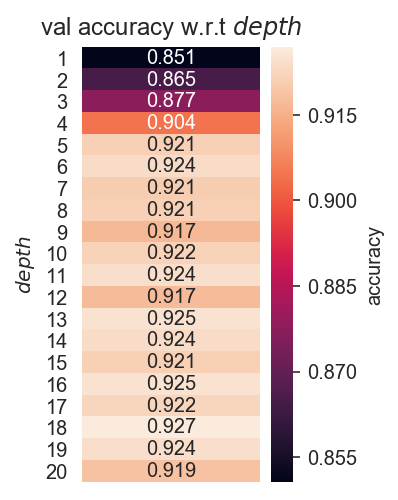

best max depth is 18
0.7375886524822696
0.9075


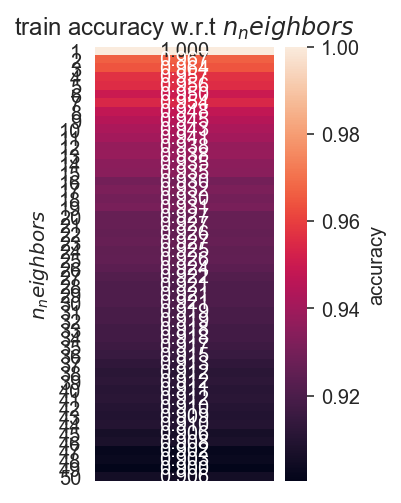

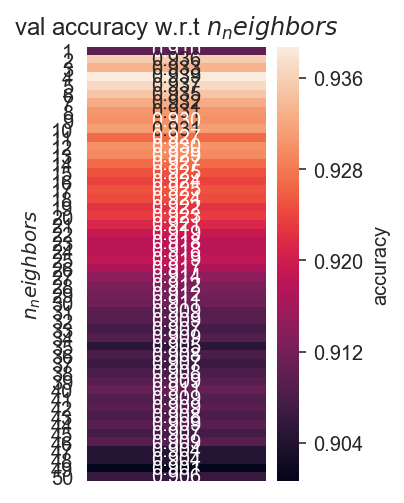

best number of nearest neighbors is 4
0.8270676691729323
0.9425


In [259]:
partitions = [0.2, 0.5, 0.8]
acc_dict = {0.2: 0, 0.5: 0, 0.8: 0}

svm_acc = [acc_dict.copy(), acc_dict.copy(), acc_dict.copy()]
tree_acc = [acc_dict.copy(), acc_dict.copy(), acc_dict.copy()]
knn_acc = [acc_dict.copy(), acc_dict.copy(), acc_dict.copy()]

for i in range(3):
    X = X_list[i]
    Y = Y_list[i]
    for split in partitions:
        for j in range(3):
            X_train_val, X_test, Y_train_val, Y_test = train_test_split(X, Y, train_size=split) # partition datset

            lin_svc = check_svm(X_train_val, Y_train_val) # get svm model with best parameters
            score = get_acc(lin_svc, X_train_val, X_test, Y_train_val, Y_test) # get accuracy
            svm_acc[i][split] += (1/3) * score # add accuracy to average

            tree = check_tree(X_train_val, Y_train_val) # get decision tree model with best parameters
            score = get_acc(tree, X_train_val, X_test, Y_train_val, Y_test) # get accuracy
            tree_acc[i][split] += (1/3) * score # add accuracy to average

            knn = check_knn(X_train_val, Y_train_val) # get knn model with best parameters
            score = get_acc(knn, X_train_val, X_test, Y_train_val, Y_test) # get accuracy
            knn_acc[i][split] += (1/3) * score # add accuracy to average


In [261]:
svm_acc

[{0.2: 0.732735775802524, 0.5: 0.7449809622706819, 0.8: 0.741160928423558},
 {0.2: 0.8628052804300665, 0.5: 0.8692367753973764, 0.8: 0.8750711222876032},
 {0.2: 0.7116524504652262, 0.5: 0.7532584684924546, 0.8: 0.7916356411802825}]

In [262]:
tree_acc

[{0.2: 0.7497346294516105, 0.5: 0.7649215602805749, 0.8: 0.781689204370893},
 {0.2: 0.7834916790922392, 0.5: 0.8326163461218403, 0.8: 0.8538369635143828},
 {0.2: 0.3994796154560968, 0.5: 0.6915943190250675, 0.8: 0.7199369582348306}]

In [263]:
knn_acc

[{0.2: 0.7265417416770117, 0.5: 0.7365329284193382, 0.8: 0.7744164661070105},
 {0.2: 0.7928762731563574, 0.5: 0.8349123183761922, 0.8: 0.8430611619036665},
 {0.2: 0.7085185185185185, 0.5: 0.7906565656565656, 0.8: 0.8208643099328111}]